<a href="https://colab.research.google.com/github/fzampirolli/pdi-vc/blob/master/notebooks_alunos/py.es/cap01/cap01_aluno.ipynb"><img src="imagens/colab-badge.png" style="height:20px;vertical-align:middle"></a>
<a href="https://github.com/fzampirolli/pdi-vc"><img src="imagens/github-badge.png" style="height:20px;vertical-align:middle"></a>

# 1 Fundamentos y Primeros Pasos

Este capítulo inaugura la **Parte 1** del libro, dedicada a los fundamentos del Procesamiento Digital de Imágenes (PDI). Se presentan la representación matemática de imágenes digitales y los principales métodos para su manipulación.

Se utiliza el lenguaje Python y la biblioteca `morph.py` (ZAMPIROLLI, 2025).

## 1.1 Objetivos

Al final de este capítulo, usted será capaz de:

- Comprender la naturaleza física y matemática de la imagen digital $f(x,y)$.
- Identificar las bandas del espectro electromagnético relevantes para PDI.
- Realizar operaciones básicas: lectura, visualización y guardado de imágenes.
- Acceder y modificar intensidades de píxeles individualmente.
- Aplicar umbralización manual.

- Configurar el entorno de desarrollo en Python.
- Manipular estructuras de arreglos (NumPy) sin caer en trampas de memoria.

## 1.2 Antes de comenzar: *Notebooks* interactivos

Este material fue construido bajo el concepto de ***Literate Programming*** (Programación Literaria), ideado por Donald Knuth en la década de 1980 (KNUTH, 1984). Knuth —también creador del sistema **TeX** para tipografía digital— propuso que los programas se escribieran como una narrativa lógica para los seres humanos, intercalando código y documentación.

Para ejecutar una celda, presione <kbd>Shift</kbd> + <kbd>Enter</kbd> o haga clic en el botón ▶️.

> ### 📝 Nota sobre el formato
>
> En las versiones renderizadas (PDF o HTML), el código se presenta en bloques estáticos con fines de lectura y referencia. La ejecución interactiva requiere el acceso a través de Google Colab (disponible en la parte superior de la página) o en un entorno local mediante VSCode o Jupyter Notebook.

## 1.3 Fundamentos

El estudio de sistemas basados en imágenes comprende un ecosistema de disciplinas integradas que transforman datos visuales brutos en conocimiento estructurado. Mientras algunas áreas se centran en la generación de representaciones, otras se dedican al tratamiento y análisis de estos datos para respaldar aplicaciones tecnológicas complejas.

El diagrama presentado en el [Figura 1.1](#fig-01-representacao) establece la distinción y complementariedad entre el Procesamiento Digital de Imágenes (PDI) y la Visión por Computador (VC). El PDI, destacado en **verde**, se centra en la transformación de imagen a imagen, con el objetivo de mejorar la calidad o realizar un preprocesamiento, como la eliminación de ruidos y el realce de contraste.

En contraste, la VC, señalada en **azul**, se centra en la interpretación del contenido visual para extraer modelos o información, como el reconocimiento de objetos y gestos. La región de intersección ilustra la sinergia entre las áreas, donde el PDI prepara los datos visuales para la interpretación por parte de la VC. El mapa también demuestra las interconexiones de ambas disciplinas con áreas como Robótica, Computación Gráfica, Inteligencia Artificial (IA) y Neurociencia.

<figure id="fig-01-representacao" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-pdf-vc.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figura 1.1:</strong> Diagrama relacional que detalla las distinciones fundamentales, sinergias e interconexiones entre PDI y VC en el contexto de sistemas basados en imágenes.</figcaption>
</figure>

### 1.3.1 👁️ Visión por Computador

- **Enfoque:** *Imagen → Modelo* (camino inverso de la Computación Gráfica).  
- **Objetivo:** Extraer información de alto nivel a partir de imágenes o videos.  
- **Aplicaciones típicas:**
  - Robótica: detección de obstáculos, localización y navegación autónoma.
  - Vigilancia e inspección: reconocimiento de eventos, lectura de placas, control de calidad.
  - Teledetección: análisis de imágenes satelitales, cartografía ambiental.
  - Imágenes médicas: detección de tumores, segmentación de órganos, ayuda al diagnóstico.
  - Interacción humano-computador: reconocimiento de gestos, expresiones faciales, seguimiento ocular.
- **Relación con otras áreas:** utiliza técnicas de Aprendizaje Automático e IA para clasificar e interpretar escenas; sirve como "ojos" de la Robótica.

### 1.3.2 🖼️ Procesamiento Digital de Imágenes (PDI)

- **Enfoque:** *Imagen → Imagen* (generalmente: transformación de una imagen en otra).  
- **Objetivo:** Mejorar la calidad visual o extraer características de bajo nivel.  
- **Aplicaciones comunes:**
  - Eliminación de ruido (filtros de media, mediana, gaussiano).
  - Mejora del contraste (ecualización de histograma, ajuste gamma).
  - Detección de bordes (Sobel, Canny, Laplaciano).
  - Segmentación (umbralización, crecimiento de regiones, *watershed*).
  - Transformaciones geométricas (redimensionamiento, rotación, corrección de perspectiva).
- **Relación con otras áreas (ver [Tabela 1.1](#tbl-01-relacoes)):**  
  - Es la **base** de la mayoría de los sistemas de VC (preprocesamiento).  
  - La Computación Gráfica aplica frecuentemente PDI para posprocesamiento (ej.: suavizado, realce).  
  - Las técnicas de IA pueden optimizar parámetros de procesamiento (ej.: aprendizaje de filtros).

<a id="tbl-01-relacoes"></a>

**Tabela 1.1:** Conexión entre PDI, VC y otras áreas de la ciencia.

| Área                      | Relación con PDI y VC                                                                 |
|---------------------------|--------------------------------------------------------------------------------------|
| **Inteligencia Artificial** | Proporciona modelos (redes neuronales, SVM) que interpretan salidas de la VC.         |
| **Robótica**               | Consume datos de VC para tomar decisiones (navegación, manipulación).                |
| **Aprendizaje Automático** | Utiliza descriptores extraídos por PDI/VC para entrenar clasificadores.              |
| **Computación Gráfica**    | Camino inverso: *modelo → imagen*; muchas veces aplica PDI para renderizado realista.|
| **Neurociencia**           | Inspira modelos de PDI (ej.: filtros similares a células ganglionares de la retina). |


## 1.4 Etapas del PDI

Las etapas del PDI se presentan en la [Figura 1.2](#fig-01-etapas), que pueden comprenderse como una cadena de transformaciones que reduce la redundancia de los datos en busca de significado:

*   **Bajo Nivel:** Actúa directamente sobre los píxeles de la imagen ruidosa para realizar mejoras y filtrados, generando como salida una imagen limpia o realzada.
*   **Nivel Medio:** Recibe la imagen tratada y realiza la segmentación y descripción, transformando la matriz de píxeles en atributos estructurados (forma, tamaño y textura).
*   **Alto Nivel:** Utiliza la tabla de atributos para alimentar procesos de lógica e inteligencia artificial, resultando en la decisión o reconocimiento final (como el diagnóstico médico).

<figure id="fig-01-etapas" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-etapas.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figura 1.2:</strong> Representación del flujo secuencial de procesamiento: la salida de cada nivel se convierte en la entrada del nivel subsiguiente.</figcaption>
</figure>

A [Figura 1.3](#fig-01-etapas2) detalla la secuencia completa del PDI, desde la captura hasta la interpretación. El flujo comienza en la Adquisición de la Imagen (1) y prosigue con el Mejoramiento (2) y la Restauración (3). A continuación, el contenido se aísla mediante la Segmentación (4) y se refina con la Morfología (5). La transición crucial ocurre en la Representación y Descripción (6), donde los objetos visuales se convierten en datos matemáticos (área, perímetro, etc.), lo que permite el Reconocimiento (7). Los procesos auxiliares incluyen el Procesamiento de Imagen en Color y la Compresión, que contribuyen a la eficiencia del almacenamiento y del análisis.


<figure id="fig-01-etapas2" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-etapas2.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figura 1.3:</strong> Flujo detallado del PDI: desde la adquisición sensorial hasta la extracción de atributos y el reconocimiento automatizado, incluyendo el procesamiento en color y la compresión.</figcaption>
</figure>

## 1.5 Formación de la Imagen y el Espectro

El proceso de formación de una imagen se fundamenta en la interacción entre la materia y la energía radiante. Esencialmente, una imagen se concibe cuando un **sensor registra la radiación** resultante de la interacción con un objeto físico. En el contexto de la visión humana y de la fotografía convencional, este fenómeno depende de una fuente de luz que ilumine la escena; las características de los objetos se codifican entonces a través de las **variaciones de intensidad y color** de la luz que alcanza el sensor, tal como se ilustra en la [Figura 1.4](#fig-01-luz).

<figure id="fig-01-luz" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-luz.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figura 1.4:</strong> Representación del espectro visible y su posición en relación con las demás radiaciones electromagnéticas, destacando la variación de las longitudes de onda de 380 nm a 750 nm.</figcaption>
</figure>

La **luz visible** ocupa solo una pequeña franja del espectro electromagnético — entre **380 nm (violeta)** y **750 nm (rojo)** — según se ilustra en [Figura 1.5](#fig-01-espectro).. Los sensores digitales convencionales operan en esa misma ventana, pero los equipos especializados pueden captar radiaciones invisibles al ojo humano, como el infrarrojo y los rayos X. En PDI, la imagen formada depende directamente de la sensibilidad espectral del sensor utilizado.

<figure id="fig-01-espectro" style="text-align:center; margin:1em 0;">
  <img src="imagens/fig-01-espectro.png" alt="" style="max-width:60%; display:block; margin:auto;" />
  <figcaption><strong>Figura 1.5:</strong> \(A\) Espectro electromagnético completo en escala logarítmica, con énfasis en el rango visible. (B) Detalle de la luz visible (380-750 nm) y sus colores. (C) Descomposición de la luz blanca por el prisma: la menor longitud de onda sufre mayor refracción, separando UV, visible e infrarrojo.</figcaption>
</figure>

A partir de ese proceso físico de adquisición, se vuelve posible modelar matemáticamente la imagen digital como una función bidimensional discreta, en la cual cada punto de la escena está representado por muestras numéricas de intensidad luminosa, formalizando así los conceptos de píxel y de imagen digital presentados en la siguiente sección.

## 1.6 ¿Qué es una Imagen Digital?

Una **imagen digital** está formada por una cuadrícula de **píxeles** (*Picture Elements*), donde cada píxel es la unidad elemental más pequeña de la imagen.

> ### 💡 1.6.1 ¿Qué es un Píxel?
>
> Un **píxel** es la unidad direccionable más pequeña que compone una imagen digital. Cada píxel ocupa una posición única en la cuadrícula y almacena uno o más valores numéricos que representan su intensidad o color.

### Representación Matemática

A diferencia de una función continua, el dominio de una imagen digital es un plano rectangular finito $\mathbb{E} \subset \mathbb{Z}^2$, que representa la cuadrícula de muestreo. Este dominio está indexado por coordenadas enteras:

<a id="eq-01-dominio"></a>
$$
\mathbb{E}  = \{ (x, y) \in \mathbb{Z}^2 \mid 0 \le x < L,\; 0 \le y < H \} \tag{1.1}
$$


Donde:

*   **$L$**: representa el ancho de la imagen (número de columnas).
*   **$H$**: representa la altura de la imagen (número de filas).

La imagen digital es una función que asocia cada par de coordenadas $(x,y)$ a uno o más valores que describen la apariencia del píxel.

<a id="eq-01-image"></a>
$$
f: \mathbb{E}  \to \mathcal{V} \tag{1.2}
$$


El conjunto $\mathcal{V}$ define los valores posibles para el píxel (codominio), variando según el tipo de imagen, como se demuestra en la [Tabela 1.2](#tbl-01-tipos-imagem).

<a id="tbl-01-tipos-imagem"></a>

**Tabela 1.2:** Principales tipos de imagen digital y sus respectivos conjuntos de valores posibles para cada píxel.

| Tipo de imagen | $\mathcal{V}$ (valores del píxel) | Representación |
|:---|:---|:---:|
| **Binaria** | $\{0, 1\}$ o $\{0, 255\}$ | ⬛◻️ |
| **Escala de grises** | $\{0, 1, \dots, 255\}$ | ░▒▓█ |
| **Color (RGB)** | $\{0, \dots, 255\}^3$ (triplas ordenadas de valores) | 🟥🟩🟦 |


**Ejemplo práctico:** Una imagen a color en el modelo RGB puede representarse matemáticamente mediante una función que asocia tres valores de intensidad a cada píxel. Computacionalmente, esta representación corresponde a tres matrices superpuestas — los canales rojo (*Red*), verde (*Green*) y azul (*Blue*) — en las cuales cada elemento almacena la intensidad luminosa del respectivo canal en una posición determinada de la imagen.

Para viabilizar los experimentos prácticos de PDI y VC, este libro utiliza el ecosistema científico de Python, integrando bibliotecas orientadas a la manipulación matricial, al procesamiento de imágenes y a la visualización de resultados, presentadas a continuación.

## 1.7 Configuración del Entorno

Este material utiliza el ecosistema científico de Python, con énfasis en
**NumPy** (computación matricial), **OpenCV** (visión computacional) y la
biblioteca **morph.py** (ZAMPIROLLI, 2025), desarrollada con fines
didácticos y utilizada a lo largo de este libro, según se presenta en la
[Tabela 1.3](#tbl-01-bibliotecas).

El proyecto está disponible actualmente en **Python** y **Portugués**. Su
organización, sin embargo, permite su expansión a otros lenguajes de
programación e idiomas.

Los **Ejercicios de Programación (EPs)** presentados al final de los capítulos
pueden ser validados mediante el módulo `testsuite.py`, que permite ejecutar casos de
prueba en diferentes lenguajes, incluidos Python, C, C++, Java, JavaScript y
R. De esta forma, los mismos casos de prueba pueden utilizarse para verificar
las soluciones desarrolladas en los *notebooks* y en **Moodle/VPL**.

<a id="tbl-01-bibliotecas"></a>

**Tabela 1.3:** Principales bibliotecas y módulos utilizados a lo largo de este libro para
computación matricial, PDI, VC, visualización y validación de los ejercicios.

| Biblioteca       | Función principal                                   |
| :--------------- | :-------------------------------------------------- |
| `numpy`          | Representación matricial y operaciones numéricas    |
| `opencv-python`  | Lectura, escritura y operaciones de visión computacional |
| `matplotlib`     | Visualización de imágenes y gráficos                |
| `morph.py`       | Abstracción didáctica de operaciones de PDI         |
| `testsuite.py`   | Ejecución y validación automática de los EPs        |


## 1.8 Versiones de `morph.py`

La biblioteca `morph.py` tiene dos versiones públicas:

* **Versión 1.0** — versión original, publicada junto con el artículo
  presentado en EduComp 2024:
  [repositorio de la versión 1.0](https://github.com/fzampirolli/morph)

* **Versión 1.1** — versión utilizada en las actividades de este libro:
  [repositorio de la versión 1.1](https://github.com/fzampirolli/pdi-vc/blob/master/morph/morph.py)

La versión 1.1 fue adaptada para atender también las restricciones de memoria del
**Moodle/VPL** (Laboratorio Virtual de Programación). En la versión 1.0, algunas
bibliotecas, como `matplotlib`, `requests` y `skimage`, se cargaban en el
momento del `import morph`. En entornos con recursos restringidos, esa
carga podía exceder el límite de memoria y producir errores como
`Jail: out of memory, 128MiB`.

En la versión 1.1, esos *imports* fueron reemplazados por **carga
*diferida* (*lazy*)** : cada biblioteca se importa únicamente mediante el método que efectivamente
la utiliza. Así, el comando `import morph` mantiene la carga inicial
reducida, utilizando principalmente `numpy` y `cv2`, mientras que los recursos
adicionales se cargan bajo demanda.

La configuración de los *notebooks* se centraliza en el archivo `config.py`,
disponible en el mismo repositorio. Ese archivo verifica las dependencias,
procura garantizar el uso de **OpenCV 5.0** y proporciona `morph.py` y, cuando
es necesario, `testsuite.py`. Cuando el entorno no cuenta con la versión adecuada
de OpenCV, el `config.py` puede reinstalar la versión requerida y, si es necesario,
solicitar el reinicio del entorno de ejecución.

De esta manera, los *notebooks* utilizan una única rutina de configuración,
reduciendo la repetición de código y facilitando la reproducción del entorno
computacional utilizado en este libro.

In [1]:
import os, urllib.request

url = "https://raw.githubusercontent.com/fzampirolli/pdi-vc/master/morph/config.py"
if not os.path.exists("config.py"):
    urllib.request.urlretrieve(url, "config.py")

import config
config.setup(testsuite=True)
from morph import mm
from testsuite import TestSuite

✅ Entorno listo. Morph: 1.1.9 | OpenCV: 5.0.0 | TestSuite: 1.1.2


## 1.9 Fundamentos de Matrices — atención a la copia de referencias

Como una imagen digital puede representarse mediante una matriz, es importante comprender cómo crear y manipular matrices correctamente. En Python, existe una trampa común al utilizar el operador `*` con listas:

> ### ⚠️ Atención a la copia de referencias
>
> Al ejecutar `m = [[0]*2]*3`, no se crean tres filas independientes. En lugar de ello, se crean tres referencias a la **misma lista**. En consecuencia, la modificación de un elemento en una de las filas también modificará el elemento correspondiente en las demás filas.

Para visualizar este comportamiento, se puede ejecutar el código en [Python Tutor](https://pythontutor.com/) y compararlo con la forma correcta de crear una matriz utilizando listas: `m = [[0]*2 for _ in range(3)]`.

En la práctica, para el procesamiento digital de imágenes (PDI), se recomienda utilizar **NumPy**, que proporciona estructuras de datos multidimensionales eficientes y operaciones vectorizadas adecuadas para la manipulación de imágenes. El siguiente código presenta diferentes formas de creación de imágenes sintéticas, cuyos resultados se muestran en la [Figura 1.6](#fig-imagens-sinteticas)..

Matriz aleatoria generada:
 72 236 199  82 118 122 
154  57 250 198 237 243 
 97 209 173 233 159  14 
 69 117  36 174 220  85 



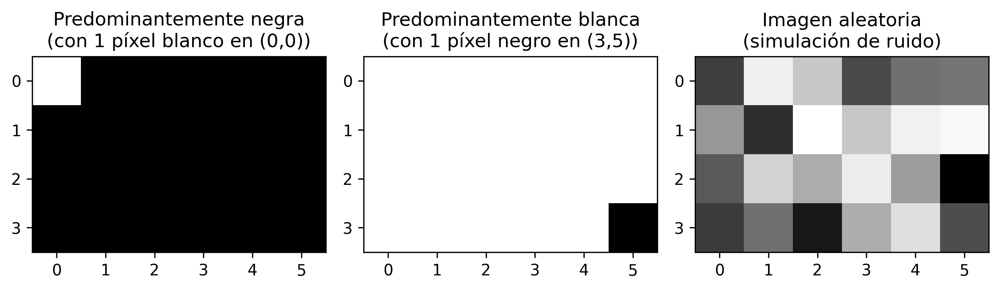

**Figura 1.6:** Ejemplos de imágenes sintéticas representadas matricialmente.


In [2]:
import numpy as np

# Creando una imagen negra (ceros) de 4, 6 píxeles
img_preta = np.zeros((4, 6), dtype='uint8')
img_preta[0,0] = 255  # píxel blanco en la esquina superior izquierda

# Creando una imagen blanca (255) de 4, 6 píxeles
img_branca = np.ones((4, 6), dtype='uint8') * 255
img_branca[3,5] = 0  # píxel negro en la esquina inferior derecha

# Creando una imagen aleatoria para pruebas (ruido)
img_random = mm.randomImage(4, 6, maxValue=255)

print("Matriz aleatoria generada:")
print(mm.drawImg(img_random))

mm.show(
    [img_preta, img_branca, img_random],
    titles=[
        "Predominantemente negra\n(con 1 píxel blanco en (0,0))",
        "Predominantemente blanca\n(con 1 píxel negro en (3,5))",
        "Imagen aleatoria\n(simulación de ruido)"
    ],
    cols=3,
    figsize=(9, 3),
    axis=True
)

## 1.10 Leyendo y Mostrando Imágenes

En bibliotecas como [NumPy](https://numpy.org/?utm_source=chatgpt.com), [OpenCV](https://opencv.org/?utm_source=chatgpt.com) y [scikit-image](https://scikit-image.org/?utm_source=chatgpt.com), las imágenes digitales se representan frecuentemente de forma computacional como *arrays* de NumPy. De esta manera, las operaciones matriciales y los conceptos de álgebra lineal pueden aplicarse directamente al PDI.

Una de las operaciones fundamentales en PDI es la lectura de imágenes.

En la biblioteca `morph.py`, la función `mm.read()` permite cargar imágenes tanto de archivos locales como de URLs, como se ilustra en la [Figura 1.7](#fig-01-natureza)..

Dimensiones (H, W, Canales): (1365, 2048, 3)
Tipo de dato: uint8


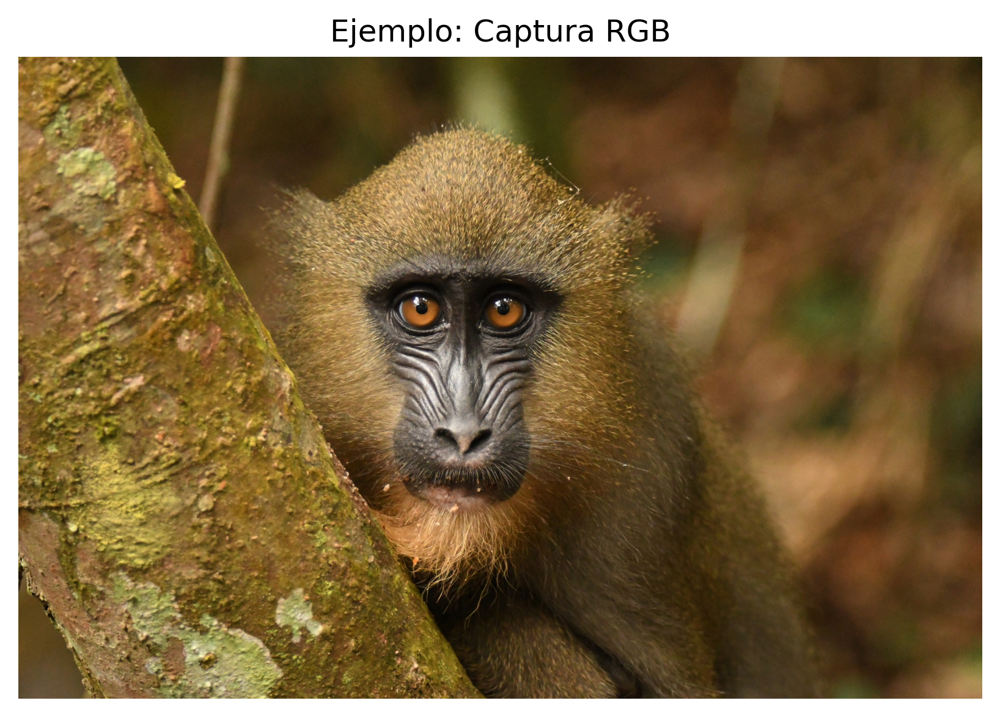

**Figura 1.7:** Mandril (Mandrillus sphinx) en ambiente natural. Crédito: Julien Renoult (CC BY 4.0).


In [3]:
import os
import numpy as np

url     = "https://upload.wikimedia.org/wikipedia/commons/8/87/Mandrillus_sphinx_339428057.jpg"
caminho = "imagens/mandrill.png"

if not os.path.exists(caminho):
    os.makedirs("imagens", exist_ok=True)
    img_obj = mm.read(url, pil=True)
    mm.write(img_obj, caminho)
else:
    img_obj = mm.read(caminho, pil=True)

img = np.array(img_obj)

print(f"Dimensiones (H, W, Canales): {img.shape}")
print(f"Tipo de dato: {img.dtype}")

mm.show(img, title="Ejemplo: Captura RGB")

### Alternativa: *Descarga* de la Imagen para Almacenamiento Local

En entornos donde la lectura directa de URLs no esté disponible —debido a restricciones de red, políticas de *firewall* o ausencia de conectividad—, una alternativa consiste en realizar previamente la *descarga* de la imagen al sistema de archivos local. Tras el almacenamiento, la imagen puede cargarse normalmente mediante la función `mm.read()`. En el siguiente ejemplo, el archivo se guarda localmente con el nombre `mandrill.png`.

```bash
!wget -O mandrill.png \
    https://upload.wikimedia.org/wikipedia/commons/8/87/Mandrillus_sphinx_339428057.jpg
```

```python
img = mm.read('mandrill.png')
mm.show(img, title="Ejemplo: Captura RGB (archivo local)")
```

#### Explicación

* `wget -O mandrill.png <URL>` realiza la *descarga* de la imagen y la almacena localmente con el nombre especificado;
* `mm.read('mandrill.png')` efectúa la lectura del archivo directamente desde el sistema de archivos, sin necesidad de solicitudes HTTP adicionales;
* esta estrategia reduce la dependencia de conectividad durante la ejecución de los experimentos y evita *descargas* repetidas de la misma imagen.

> ### 💡 Nota
>
> El prefijo `!` se utiliza en entornos basados en *notebooks*, como [Jupyter Notebook](https://jupyter.org/?utm_source=chatgpt.com), [JupyterLab](https://jupyter.org/?utm_source=chatgpt.com) y [Google Colab](https://colab.research.google.com/?utm_source=chatgpt.com), para ejecutar comandos del sistema operativo directamente en celdas de código. En terminales convencionales, el comando debe utilizarse sin el prefijo `!`.
>
> Si la utilidad `wget` no está instalada, se puede usar alternativamente:
>
> ```bash
> !curl -o mandrill.png \
>     https://upload.wikimedia.org/wikipedia/commons/8/87/Mandrillus_sphinx_339428057.jpg
> ```

## 1.11 Conversión de Tipos y Umbralización

Como vimos, una imagen a color en el espacio RGB se representa mediante la función:

<a id="eq-01-cinza"></a>
$$
f: \mathbb{E} \to \{0,1,\dots,255\}^3
$$

Es decir, para cada píxel $(x,y)$, tenemos tres valores $(R,G,B)$ que definen su color.

### Conversión a Escala de Grises

Para convertir una imagen RGB a escala de grises (*grayscale*), es necesario combinar los tres canales en un único valor de intensidad $g$, que representa el brillo percibido. Como el ojo humano no es igualmente sensible al rojo, verde y azul, se utiliza una **media ponderada**. El estándar [ITU-R BT.601](https://www.itu.int/rec/R-REC-BT.601/) ({ITU-R}, 2011) define los siguientes pesos:

$$
g = 0.299\,R + 0.587\,G + 0.114\,B \tag{1.3}
$$


Tras el cálculo, el valor $g$ se redondea al entero más cercano y se ajusta al intervalo $[0, 255]$. El resultado es una nueva imagen, ahora en escala de grises, representada por:

<a id="eq-01-limiar"></a>
$$
f_{\text{gris}}: \mathbb{E} \to \{0,1,\dots,255\}
$$

### Umbralización (*Thresholding*)

A partir de la imagen en escala de grises $f_{\text{gris}}(x,y)$, una operación fundamental es la **umbralización**, que produce una imagen **binaria** (solo blanco y negro). Para ello, se elige un valor de corte $T$ (generalmente en el intervalo $[0,255]$) y se define:

$$
f_{\text{bin}}(x,y) = 
\begin{cases} 
255 & \text{si } f_{\text{gris}}(x,y) > T \\[4pt]
0 & \text{en caso contrario}
\end{cases} \tag{1.4}
$$


**Ejemplo:** Con $T = 128$, los píxeles con intensidad superior a 128 se vuelven blancos (255); los demás se vuelven negros (0).

La umbralización se usa ampliamente para **segmentar objetos del fondo**, extraer bordes o crear máscaras binarias para el procesamiento posterior. 

> **Nota:** El valor 255 representa el blanco máximo en imágenes de 8 bits, mientras que 0 representa el negro absoluto.

### Ejemplo práctico de conversión y umbralización

La [Figura 1.8](#fig-01-processamento-basico) ilustra los principales pasos para transformar una imagen a color en escala de grises y, posteriormente, convertirla en una imagen binaria mediante umbralización. 
El siguiente código implementa estas etapas:

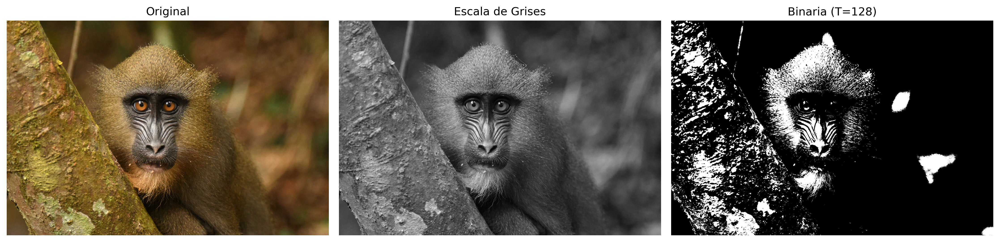

**Figura 1.8:** Procesamiento básico de imágenes: (a) imagen original, (b) imagen en escala de grises, (c) imagen binarizada por umbral (T=128).


In [4]:
# 1. Convertir a Escala de Grises
img_gray = mm.gray(img)

# 2. Aplicar umbral (Píxeles > 128 se convierten en 255, otros 0)
limiar = 128
img_binaria = mm.threshold(img_gray, limiar)

# Uso de la nueva función
mm.show(
    [img, img_gray, img_binaria], 
    titles=["Original", "Escala de Grises", f"Binaria (T={limiar})"],
    cols=3
)

## 1.12 Umbralización por el método de Otsu

Como se presentó en la [Equação 1.4](#eq-01-limiar), la umbralización convierte una imagen en tonos de grises a una binaria usando un valor de corte $T$. Hasta ahora fijamos $T = 128$ manualmente.

```python
img_bin_fixo = mm.threshold(img_gray, T=128)
```

Sin embargo, la elección manual de $T$ no siempre es trivial. La biblioteca `mm` ofrece una alternativa automática: cuando el parámetro `limiar` **no se proporciona**, la función `mm.threshold(img_gray)` calcula el valor de $T$ mediante el **método de Otsu** (OTSU, 1979). Este método, que se detallará en capítulos futuros, maximiza la varianza entre clases del histograma (frecuencia de cada tono de gris), separando automáticamente los píxeles de objeto y fondo.

El código siguiente compara la umbralización manual ($T=128$) con la automática (Otsu), mostrando también el valor de $T$ calculado:

Umbral calculado por Otsu: T = 95.0


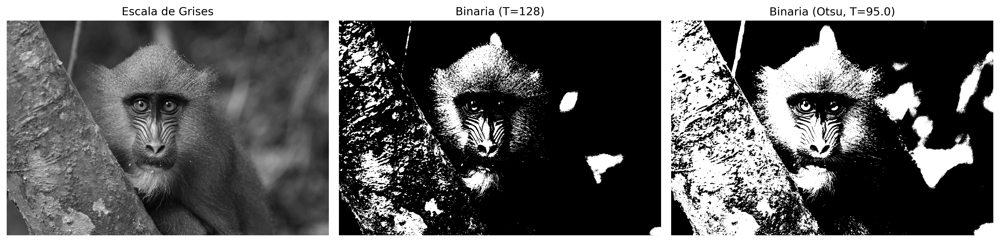

**Figura 1.9:** Comparación entre umbralización manual (T=128) y automática (Otsu) sobre la imagen en escala de grises.


In [5]:
import cv2
# Umbralización con T fijo (manual)
T_fixo = 128
img_bin_fixo = mm.threshold(img_gray, T_fixo)

# Umbralización por el método de Otsu (T automático)
T_otsu, img_bin_otsu = cv2.threshold(img_gray, 0, 255,
                                      cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(f'Umbral calculado por Otsu: T = {T_otsu}')
# o simplemente:
# img_bin_otsu = mm.threshold(img_gray)

# Exhibición lado a lado
mm.show(
    [img_gray, img_bin_fixo, img_bin_otsu], 
    titles=["Escala de Grises", f"Binaria (T={T_fixo})", f"Binaria (Otsu, T={T_otsu})"],
    cols=3
)

La [Figura 1.9](#fig-01-otsu) muestra que el umbral obtenido por Otsu se adapta automáticamente a la imagen, resultando en una binarización más eficiente que un valor fijo, especialmente cuando las intensidades del objeto y del fondo están bien separadas en el histograma. Esta técnica es ampliamente utilizada en sistemas de VC para la binarización de documentos, detección de objetos y preprocesamiento de imágenes.

> ### 💡 Simplicidad de la biblioteca `morph.py`
>
> Mientras que OpenCV exige la llamada completa:
>
> ```python
> T_otsu, img_bin = cv2.threshold(img_gray, 0, 255,
>                                 cv2.THRESH_BINARY + cv2.THRESH_OTSU)
> ```
>
> la biblioteca `mm` abstrae toda esa complejidad: basta con llamar a `mm.threshold(img_gray)`. El umbral de Otsu se calcula automáticamente y la imagen binaria se devuelve directamente. Este enfoque permite concentrarse en el concepto, no en los detalles de implementación.

## 1.13 Acceso a Píxeles

En Python con NumPy, una imagen está estructurada como un **array multidimensional**. El acceso a un píxel específico utiliza la convención matricial **fila** (eje Y) y **columna** (eje X): `img[fila, columna]`.

El código de la [Figura 1.10](#fig-01-pixel-acesso) demuestra cómo extraer estos valores en imágenes de color (RGB) y en escala de grises, además de aislar la vecindad inmediata del punto de interés.

📌 VALORES EN EL PÍXEL OBJETIVO (600, 800):
   • Tonos de gris (Escalar) : 81
   • Colorido (Vector RGB)    : R=92, G=78, B=67
--------------------------------------------------
🔍 MATRIZ DE VECINDARIO 3x3 EN TONOS DE GRIS:
   (El píxel objetivo central está resaltado entre corchetes)

     83    96   105 
     85  [ 81]   96 
     83    77    84 


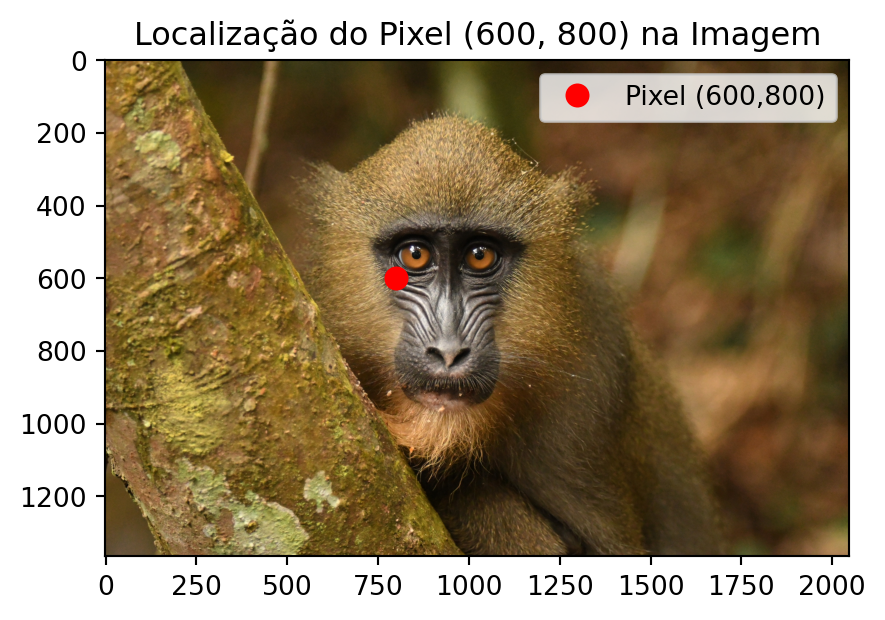

**Figura 1.10:** Acceso a un píxel específico (r, c) y la representación de su vecindario en la imagen.


In [6]:
import matplotlib.pyplot as plt

# 1. Definición de las coordenadas del píxel objetivo
r, c = 600, 800

# 2. Acceso directo a los valores de los píxeles
pixel_cinza = img_gray[r, c]
pixel_rgb   = img[r, c]

print(f"📌 VALORES EN EL PÍXEL OBJETIVO ({r}, {c}):")
print(f"   • Tonos de gris (Escalar) : {pixel_cinza}")
print(f"   • Colorido (Vector RGB)    : R={pixel_rgb[0]}, G={pixel_rgb[1]}, B={pixel_rgb[2]}")
print("-" * 50)

# 3. Exhibición didáctica del vecindario 3x3 alrededor del píxel (r, c)
# Recorta desde la fila r-1 hasta r+1, y desde la columna c-1 hasta c+1
vizinhanca_gray = img_gray[r-1:r+2, c-1:c+2]

print(f"🔍 MATRIZ DE VECINDARIO 3x3 EN TONOS DE GRIS:")
print(f"   (El píxel objetivo central está resaltado entre corchetes)\n")

# Impresión formateada para resaltar el píxel central
for i, linha in enumerate(vizinhanca_gray):
    linhas_str = []
    for j, valor in enumerate(linha):
        if i == 1 and j == 1:
            linhas_str.append(f"[{valor:3d}]") # Resalta el centro (100, 100)
        else:
            linhas_str.append(f" {valor:3d} ")
    print("   " + " ".join(linhas_str))

# 4. Demostración visual usando el mm.show (opcional, pero excelente para el libro)
# Muestra la imagen completa con un punto demarcando la región
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.plot(c, r, 'ro', markersize=8, label=f'Pixel ({r},{c})') # Traza (x, y) -> (c, r)
plt.title(f"Localização do Pixel ({r}, {c}) na Imagem")
plt.legend()
plt.axis('on') # Mantiene los ejes para que el estudiante vea las coordenadas 100, 100
plt.show()

**Explicación línea por línea:**

1. `img_gray[r, c]` — Devuelve un único valor entero (escalar) entre 0 y 255, que representa la intensidad de brillo del gris.
2. `img[r, c]` — Devuelve un vector con tres valores `[R, G, B]`, correspondientes a las intensidades de los canales Rojo, Verde y Azul.
3. `img_gray[r-1:r+2, c-1:c+2]` — Realiza un cortado (*slicing*) para extraer la submatriz $3\times 3$ alrededor del píxel. Esta operación es la base para la implementación de filtros espaciales y convoluciones.
4. El bucle `for` subsiguiente solo formatea esa submatriz en la consola, mostrando el píxel central entre corchetes `[ ]` con fines didácticos.
5. La función `plt.plot(c, r, 'ro')` traza un punto rojo sobre la imagen para correlacionar la coordenada numérica con su posición visual. Nótese que Matplotlib utiliza el orden predeterminado de pantalla `(X, Y)`, invirtiéndolo a `(c, r)`.

Dado que la indexación en Python comienza en cero (*zero-based*), la esquina superior izquierda de la imagen es la coordenada `(0,0)`. Recuerde siempre esta regla: la primera dimensión de la matriz controla la **altura** (filas/Y) y la segunda controla la **anchura** (columnas/X).

## 1.14 Resumen

En este capítulo se presentaron los fundamentos de la representación de imágenes digitales: la definición de píxel, la estructuración de imágenes en matrices y el impacto del muestreo y la cuantificación en la calidad final:

- **Imagen digital** = función $f(x,y)$ que mapea coordenadas a intensidades (escalares o vectoriales).
- **Dominio**: conjunto finito $\mathbb{E} = \{(x,y) \in \mathbb{Z}^2 \mid 0 \le x < L,\; 0 \le y < H\}$.
- **Tipos principales**: binaria ($\mathcal{V} = \{0, 255\}$), escala de grises ($\mathcal{V} = [0,255]$) y RGB ($\mathcal{V} = [0,255]^3$).
- **Umbralización** convierte la escala de grises en binaria; el **método de Otsu** determina el valor de corte automáticamente maximizando la varianza entre clases.

- La biblioteca `morph.py` (o `mm`) ofrece funciones didácticas para operaciones básicas de PDI, como `mm.gray()`, `mm.threshold()`, `mm.show_multiple()`.
- **Trampa NumPy**: nunca uses `[[0]*n]*m` para crear matrices — usa siempre `np.zeros()` o `np.ones()`.
- Acceso a píxeles mediante `img[linha, coluna]`, con indexación ***zero-based***.

El Capítulo 2 abordará **histogramas y ecualización de contraste**.

## 1.15 🤖 Uso del Gemini Notebook como Tutor Complementario

En esta edición, además de los *notebooks* interactivos en Google Colab, el **Gemini Notebook** está disponible como herramienta complementaria de estudio. La plataforma utiliza exclusivamente los documentos proporcionados por el autor como base de conocimiento, garantizando respuestas coherentes con el contenido del libro.

> ### ❗ 🎓 Estudia con el Tutor Inteligente
>
> Accede al entorno del capítulo a través del *enlace* a continuación y explora especialmente las opciones **Guía de Estudio** y **Conversación** para profundizar tu comprensión.
>
> [🚀 ACCEDER A GEMINI NOTEBOOK: CAPÍTULO 01](https://notebooklm.google.com/notebook/022d09fb-4dee-46b1-ad18-787987fe976d)
>
> #### 🌐 Idioma y Lenguaje de Programación
>
> El proyecto de este capítulo en Gemini Notebook fue construido únicamente con el texto en **portugués** y los ejemplos de código en **Python**. Si estás estudiando con la edición en inglés o francés, o siguiendo la ruta en C++, las respuestas del tutor pueden no corresponder exactamente a la versión que estás leyendo.
>
> #### ⚠️ Aviso sobre Contenido Generado por IA
>
> La IA es una poderosa aliada en los estudios, pero el contenido generado puede contener **errores o imprecisiones**. Consulta siempre **libros, artículos científicos y otras fuentes académicas confiables** para validar la información. Siempre que sea posible, ejecuta los ejemplos prácticos proporcionados en este capítulo para verificar los resultados.

### Funcionalidades Disponibles en la Plataforma

**Gemini Notebook** ofrece una suite avanzada de herramientas basadas en IA para transformar el contenido estático del libro en una experiencia de aprendizaje dinámica y multimedia. La plataforma utiliza técnicas de **RAG** (*Retrieval-Augmented Generation*), fundamentadas en el trabajo de Lewis (2020), para basar las respuestas estrictamente en los documentos proporcionados y minimizar la ocurrencia de alucinaciones.

Las principales funcionalidades incluyen:

* **Resúmenes Multimodales (Audio y Video)**: Generación de conversaciones naturales entre expertos en el formato de **Resumen de Audio** (estilo *podcast*) y **Resumen de Video**, discutiendo los temas centrales del capítulo, como las diferencias entre PDI y VC, o la interpretación de transformaciones como la umbralización y el método de Otsu.
* **Visualización de Estructuras (Mapa Mental e Infografía)**: Creación automática de diagramas que conectan visualmente los conceptos, por ejemplo, el flujo de procesamiento desde la captura de la imagen digital, pasando por la conversión a tonos de gris, umbralización y segmentación binaria.
* **Herramientas de Evaluación (Prueba y Tarjetas Didácticas)**: Generación de **Pruebas** de opción múltiple y **Tarjetas Didácticas** (*flashcards*) para la fijación de conocimientos, basadas en el texto autoral (ej.: preguntas sobre la fórmula de conversión RGB→gris o sobre el funcionamiento del umbral global y de Otsu).
* **Apoyo a la Presentación (*Diapositivas* e Informes)**: Ayuda en la estructuración de **Presentaciones de *Diapositivas*** y en la redacción de **Informes** técnicos, facilitando la comunicación de resultados de experimentos con imágenes.
* **Análisis de Datos (Tabla de Datos)**: Organización de datos extraídos del texto en tablas estructuradas, ayudando en la comprensión de ejemplos prácticos, como la comparación entre diferentes valores de umbral.
* ***Chat* Contextualizado**: Permite el cuestionamiento directo sobre el código y la teoría, como: *"¿Cómo implementar la conversión de RGB a tonos de gris usando los pesos del estándar ITU‑R BT.601?"* o *"¿Qué sucede con la imagen binaria si elijo un umbral T=200 en lugar de T=128?"*.

## 1.16 Lista de Ejercicios

1. (15%) Con sus propias palabras, defina **imagen digital** y **píxel**. Dé un ejemplo concreto de cómo una imagen a color (RGB) se representa matricialmente en el computador.

2. (15%) Explique las diferencias entre **imagen binaria**, **escala de grises (8 bits)** y **color RGB**, indicando el rango de valores posibles para cada píxel en cada tipo.

3. (20%) Considerando la fórmula de conversión RGB → escala de grises del estándar ITU‑R BT.601:
   $$g = 0.299\,R + 0.587\,G + 0.114\,B$$
   Calcule el valor del píxel en escala de grises para $(R,G,B) = (80, 180, 30)$. Redondee al entero más cercano.

4. (20%) ¿Qué es **umbralización** (*thresholding*)? Explique la diferencia entre elegir un umbral $T$ fijo (ej.: $T=128$) y utilizar el **método de Otsu** para la determinación automática del umbral. En pocas palabras, ¿cómo elige el umbral el método de Otsu?

5\. (15%) En el contexto de la biblioteca didáctica `mm` discutida en el capítulo, responda:
   - a) (7,5%) ¿Cómo se accede al valor del píxel en la posición (fila=50, columna=60) de una imagen en tonos de gris `img_gray`?
   - b) (7,5%) ¿Cuál es la ventaja de usar `mm.threshold(img_gray)` sin pasar el umbral? Compare con la llamada equivalente en OpenCV.

6\. (15%) ¿Qué devuelve la propiedad `img.shape` para una imagen NumPy en formato RGB? Dé un ejemplo concreto con una imagen de 640×480 píxeles.

## Referencias del Capítulo

La fundamentación teórica de este capítulo comprende las siguientes obras de PDI y VC:

* Gonzalez (2018) para los fundamentos de **Procesamiento Digital de Imágenes** (PDI).
* Singh (2019) para la implementación práctica de métodos de **procesamiento y análisis de imágenes**.
* Szeliski (2022) para el estudio de VC y algoritmos fundamentales.
* Bradski (2008) para la aplicación de la biblioteca **OpenCV** en el entorno Python.
* Lewis (2020) para el concepto de **generación aumentada por recuperación (RAG)**, utilizado en el soporte al procesamiento de la información de este material.

------------------------------------------------------------------------


<a href="https://colab.research.google.com/github/fzampirolli/pdi-vc/blob/master/notebooks_alunos/py.es/cap01/cap01.EPs_aluno.ipynb"><img src="imagens/colab-badge.png" style="height:20px;vertical-align:middle"></a>
<a href="https://github.com/fzampirolli/pdi-vc"><img src="imagens/github-badge.png" style="height:20px;vertical-align:middle"></a>

## 1.17 💻 **Parte Práctica con Ejercicios de Programación**

### 🎯 Objetivo de este Cuaderno

Los **Ejercicios de Programación (EPs)** presentados a continuación también pueden enviarse en actividades del Moodle (actividades VPL) que proporcionan *feedback* automático.

**Este cuaderno fue desarrollado para superar limitaciones de uso del Moodle.** Con él, se debe:

1. **Desarrollar:** Escribir y editar tu solución directamente en el entorno Colab.
2. **Validar:** Probar tu código localmente utilizando los **mismos casos de prueba** del Moodle.
3. **Organizar:** Guardar tus códigos de las actividades VPL de forma segura.
4. **Evaluar:** Cuando estés conectado al Moodle, basta con copiar tu solución y hacer clic en **Evaluar** en el Moodle (**si estás en la red de la UFABC**) para registrar tu nota oficial.

### ⚙️ Instrucciones Paso a Paso

En un entorno de ejecución (como VSCode, Jupyter o Colab), siga el orden a continuación para configurar el entorno y validar sus ejercicios:

#### Preparación del Entorno
Ejecute la celda de código a continuación para descargar `morph.py` y `testsuite.py` del repositorio de la disciplina — solo si aún no existen en el directorio local. Con ambos en `./`, el *notebook* y los subprocesos del `TestSuite` encuentran el módulo sin configuraciones adicionales de ruta.

*Nota:* El script `testsuite.py` buscará automáticamente los casos de prueba en `all/{cap}/cases` en [GitHub](https://github.com/fzampirolli/pdi-vc/tree/master/all).

#### Escribiendo el Código
Guarde su solución en una celda de código usando el comando mágico `%%writefile`. El nombre del archivo debe seguir el patrón `EPX_Y.*`, donde `X` es el capítulo, `Y` es el ejercicio y `*` es la extensión del lenguaje.

> **Ejemplo:** `%%writefile EP01_01.py`

#### *Descarga*

Descargue `morph.py` y `testsuite.py` ejecutando la celda a continuación:

In [7]:
import os, urllib.request

url = "https://raw.githubusercontent.com/fzampirolli/pdi-vc/master/morph/config.py"
if not os.path.exists("config.py"):
    urllib.request.urlretrieve(url, "config.py")

import config
config.setup(testsuite=True)
from morph import mm
from testsuite import TestSuite

✅ Entorno listo. Morph: 1.1.9 | OpenCV: 5.0.0 | TestSuite: 1.1.2


#### Ejecutando los Testes
Después de guardar el archivo con tu solución, ejecuta el comando a continuación (en una nueva celda) para evaluar los testes automáticos:

```python
TestSuite("EP01_01.extensión").run()
```

Reemplaza la extensión según el lenguaje usado:

| Lenguaje | Extensión |
|-----------|----------|
| Python    | `.py`    |
| Java      | `.java`  |
| C         | `.c`     |
| C++       | `.cpp`   |
| JavaScript| `.js`    |
| R         | `.r`     |



> **Cómo funciona:** El `TestSuite` descarga los casos de prueba de GitHub, ejecuta tu programa con cada entrada y compara la salida con la esperada – calculando automáticamente tu nota.


Para probar código Python directamente, sin guardar archivo, usa `run_code(codigo)` pasando el código como *string* en una variable `codigo`:

```python
codigo = """
from morph import mm
# 1 ... tu código aquí ...
"""
TestSuite("EP04_01").run_code(codigo)
```

### ⚠️ Importante: Reglas y Buenas Prácticas

#### 🔹 Sobre la Entrada de Datos

Su programa debe leer la entrada estándar (teclado).

* **Python:** Utilice `input()`.
* **Otros lenguajes:** Utilice el comando de lectura estándar equivalente (`cin`, `Scanner`, etc.).

#### 🔹 Configuración de IA en Colab

Para un mejor aprendizaje, se recomienda desactivar el autocompletado de código por IA, ya que no estará disponible durante las evaluaciones. Por ejemplo, en el navegador Chrome:

* Vaya a: **Herramientas > Configuración > IA generativa**
* Desmarque: **Habilitar generación de código**

#### 🔹 Integridad Académica (Plagio)

Este recurso de pruebas locales se aplica a EPs **sin variaciones**. Sin embargo:

* **Individualidad:** Cada estudiante debe desarrollar su propia solución.
* **Detección de Similitud:** El profesor utiliza herramientas que detectan copias, **incluso con cambios de nombres de variables o espacios en blanco**.

### 1.0.1 EP01_01 📏 Tres métricas de distancia en PDI

En esta actividad, debes escribir un programa que calcule las tres distancias clásicas en PDI: **Euclidiana (L2)**, **City‑Block (L1)** y ***Chessboard* (L∞)**.

* Lee **4 números reales** que representan las coordenadas: $A_x, A_y, B_x, B_y$.
* Calcula las tres distancias utilizando las fórmulas:

$$d_{\text{Euclidiana}} = \sqrt{(B_x - A_x)^2 + (B_y - A_y)^2}$$

$$d_{\text{City-block}} = |B_x - A_x| + |B_y - A_y|$$

$$d_{\text{Chessboard}} = \max\big(|B_x - A_x|,\; |B_y - A_y|\big)$$

* Imprime los tres resultados, cada uno en una línea, formateados con **dos cifras decimales**, en el orden: **Euclidiana**, ***City‑block***, ***Chessboard***.

📌 **Importante**:

* Utiliza las funciones matemáticas estándar de tu lenguaje: `math.sqrt`, `abs` (o `fabs`) y `max`.
* La salida debe contener **solo los números** (uno por línea), sin textos adicionales.
* Consulta un simulador interactivo para esta cuestión en la **[Figura 1.11](#fig-01-sim-ep0101-distancia)** (gráfico con arrastre de los puntos y visualización de las tres métricas).

#### 1.0.1.1 🖼️ ¿Por qué es importante? – Costo computacional

En una imagen **1000×1000 píxeles** (1 millón de píxeles), calcular la distancia de cada píxel a un punto de referencia exige **1 millón de operaciones**. La elección de la métrica afecta el rendimiento:

| Métrica | Operaciones por píxel | Costo relativo (1M píxeles) | Cuándo usar |
| --- | --- | --- | --- |
| **Euclidiana (L2)** | 2 restas, 2 multiplicaciones, 1 suma, 1 `sqrt` | 🔴 Más costosa – `sqrt` es cara | Distancia “real” en el espacio continuo |
| ***City‑block* (L1)** | 2 restas, 2 `abs`, 1 suma | 🟡 Moderada – sin raíz cuadrada | Cuadrículas, robótica, imágenes binarias |
| ***Chessboard* (L∞)** | 2 restas, 2 `abs`, 1 `max` | 🟢 Más eficiente | Movimientos de piezas, morfología |

La función `sqrt` es computacionalmente más cara que operaciones como suma, resta, multiplicación y valor absoluto. En CPUs modernas, la diferencia puede ser pequeña (alrededor de 1,5× a 3×), pero en sistemas embebidos o en bucles de millones de iteraciones, cualquier ganancia importa. Por eso, **cuando el objetivo es solo comparar distancias** (p. ej.: encontrar el punto más cercano), usa la **distancia euclidiana al cuadrado**.

#### 1.0.1.2 📋 Tarea (especificación para VPL)

**Entrada:**  
Una única línea con cuatro números reales: `Ax Ay Bx By`

**Salida:**  
Tres líneas, cada una con un número real de dos cifras decimales (Euclidiana, City‑block, Chessboard).


#### 1.0.1.3 📌 Ejemplos

| Entrada | Salida | Observación |
| --- | --- | --- |
| `0`<br>`0`<br>`3`<br>`4` | `5.00`<br>`7.00`<br>`4.00` | Triángulo 3‑4‑5 |
| `0`<br>`0`<br>`1`<br>`1` | `1.41`<br>`2.00`<br>`1.00` | Diagonal unitaria |

**Ejemplo de prueba de `sqrt` en Python, con `timeit` aislando cada operación:**

In [8]:
import math
import timeit

N = 50_000_000

def apenas_soma():
    a, b = 3.0, 4.0
    return a + b

def soma_e_sqrt():
    a, b = 3.0, 4.0
    return math.sqrt(a*a + b*b)

t_soma = timeit.timeit(apenas_soma, number=N)
t_sqrt = timeit.timeit(soma_e_sqrt, number=N)

print(f"Suma simple       : {t_soma:.3f} s")
print(f"Suma + sqrt        : {t_sqrt:.3f} s")
print(f"Razón (sqrt/suma)  : {t_sqrt/t_soma:.2f}x")

Suma simple       : 2.548 s
Suma + sqrt        : 4.741 s
Razón (sqrt/suma)  : 1.86x


In [9]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0101-distancia" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">🎮 Simulador EP01_01: Métricas de Distancia en el Espacio Discreto</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">Euclidiana vs City-block vs Chessboard</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Haz clic y arrastra los puntos <b>A</b> o <b>B</b> en el plano cartesiano o ajusta sus coordenadas abajo para comparar las tres métricas de distancia en tiempo real.</p>

    <!-- Cards de Exibição das Métricas -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(180px, 1fr));gap:10px;margin-bottom:16px;">
      
      <!-- Euclidiana -->
      <div style="background:#f4f0fd;border-radius:12px;padding:10px;text-align:center;border:1px solid #dcd0f9;">
        <div style="font-size:10px;font-weight:700;letter-spacing:.3px;color:#6b46c1;">📐 EUCLIDIANA (L2)</div>
        <div id="sim_ep0101_dispE" style="font-size:24px;font-weight:700;font-family:monospace;color:#6b46c1;margin:2px 0;">5.00</div>
        <div style="font-size:9px;font-family:monospace;color:#805ad5;">√(Δx² + Δy²)</div>
      </div>

      <!-- City-block -->
      <div style="background:#e8f8f5;border-radius:12px;padding:10px;text-align:center;border:1px solid #a3e4d7;">
        <div style="font-size:10px;font-weight:700;letter-spacing:.3px;color:#117a65;">🧱 CITY-BLOCK (L1)</div>
        <div id="sim_ep0101_dispC" style="font-size:24px;font-weight:700;font-family:monospace;color:#117a65;margin:2px 0;">7.00</div>
        <div style="font-size:9px;font-family:monospace;color:#16a085;">|Δx| + |Δy|</div>
      </div>

      <!-- Chessboard -->
      <div style="background:#fdebd0;border-radius:12px;padding:10px;text-align:center;border:1px solid #f8c471;">
        <div style="font-size:10px;font-weight:700;letter-spacing:.3px;color:#b9770e;">🏁 CHESSBOARD (L∞)</div>
        <div id="sim_ep0101_dispX" style="font-size:24px;font-weight:700;font-family:monospace;color:#b9770e;margin:2px 0;">4.00</div>
        <div style="font-size:9px;font-family:monospace;color:#d68910;">max(|Δx|, |Δy|)</div>
      </div>

    </div>

    <!-- Layout Interativo: Canvas + Painel de Controle -->
    <div style="display:flex;flex-wrap:wrap;gap:16px;">
      
      <!-- Lado Esquerdo: Canvas Plano Cartesiano -->
      <div style="flex:2;min-width:260px;">
        <canvas id="sim_ep0101_canvas" width="380" height="280" style="display:block;width:100%;height:auto;background:#fafaf7;border-radius:12px;border:1px solid #e4dcc8;cursor:crosshair;touch-action:none;"></canvas>
        <div style="font-size:9.5px;text-align:center;margin-top:6px;color:#8a8371;">👆 Arrastra los puntos <b>A (Morado)</b> o <b>B (Naranja)</b> en la cuadrícula.</div>
      </div>

      <!-- Lado Direito: Controles Numéricos de Posição -->
      <div style="flex:1.2;min-width:180px;display:flex;flex-direction:column;gap:10px;">
        
        <!-- Ponto A -->
        <div style="background:#fafaf7;border-radius:12px;border:1px solid #e9e3d3;padding:10px;">
          <div style="font-size:11px;font-weight:700;display:flex;align-items:center;gap:6px;margin-bottom:8px;color:#26241d;">
            <span style="display:inline-block;width:10px;height:10px;background:#6b46c1;border-radius:50%;"></span> Punto A
          </div>
          <div style="display:flex;align-items:center;gap:6px;margin-bottom:6px;">
            <label style="font-size:11px;font-weight:700;color:#5e5a4a;width:20px;">Ax</label>
            <input type="number" id="sim_ep0101_axN" value="0" step="0.5" style="width:52px;font-size:11px;font-family:monospace;border:1px solid #e4dcc8;border-radius:6px;padding:3px 4px;text-align:center;">
            <input type="range" id="sim_ep0101_axR" min="-7" max="7" value="0" step="0.5" style="flex:1;cursor:pointer;">
          </div>
          <div style="display:flex;align-items:center;gap:6px;">
            <label style="font-size:11px;font-weight:700;color:#5e5a4a;width:20px;">Ay</label>
            <input type="number" id="sim_ep0101_ayN" value="0" step="0.5" style="width:52px;font-size:11px;font-family:monospace;border:1px solid #e4dcc8;border-radius:6px;padding:3px 4px;text-align:center;">
            <input type="range" id="sim_ep0101_ayR" min="-7" max="7" value="0" step="0.5" style="flex:1;cursor:pointer;">
          </div>
        </div>

        <!-- Ponto B -->
        <div style="background:#fafaf7;border-radius:12px;border:1px solid #e9e3d3;padding:10px;">
          <div style="font-size:11px;font-weight:700;display:flex;align-items:center;gap:6px;margin-bottom:8px;color:#26241d;">
            <span style="display:inline-block;width:10px;height:10px;background:#b9770e;border-radius:50%;"></span> Punto B
          </div>
          <div style="display:flex;align-items:center;gap:6px;margin-bottom:6px;">
            <label style="font-size:11px;font-weight:700;color:#5e5a4a;width:20px;">Bx</label>
            <input type="number" id="sim_ep0101_bxN" value="3" step="0.5" style="width:52px;font-size:11px;font-family:monospace;border:1px solid #e4dcc8;border-radius:6px;padding:3px 4px;text-align:center;">
            <input type="range" id="sim_ep0101_bxR" min="-7" max="7" value="3" step="0.5" style="flex:1;cursor:pointer;">
          </div>
          <div style="display:flex;align-items:center;gap:6px;">
            <label style="font-size:11px;font-weight:700;color:#5e5a4a;width:20px;">By</label>
            <input type="number" id="sim_ep0101_byN" value="4" step="0.5" style="width:52px;font-size:11px;font-family:monospace;border:1px solid #e4dcc8;border-radius:6px;padding:3px 4px;text-align:center;">
            <input type="range" id="sim_ep0101_byR" min="-7" max="7" value="4" step="0.5" style="flex:1;cursor:pointer;">
          </div>
        </div>

        <!-- Botão Reset -->
        <button id="sim_ep0101_btnReset" style="background:#26241d;color:#7ee7c6;border:none;border-radius:9px;font-size:11px;font-weight:700;padding:8px 0;cursor:pointer;width:100%;font-family:monospace;">⟳ Restablecer A(0,0) & B(3,4)</button>

      </div>

    </div>

    <!-- Legenda Inferior -->
    <div style="font-size:10px;text-align:center;padding:8px 12px;margin-top:14px;color:#8a8371;border-top:1px solid #e4dcc8;background:#fafaf7;border-radius:8px;">
      <b>Leyenda Geométrica:</b> Línea discontinua (Euclidiana), Camino ortogonal en L (City-block) y Resalte de la dimensión máxima (Chessboard).<br>
      <div style="display:flex;gap:16px;justify-content:center;margin-top:6px;flex-wrap:wrap;">
        <span style="display:inline-flex;align-items:center;gap:4px;"><span style="display:inline-block;width:16px;height:2px;background:#6b46c1;"></span> Euclidiana</span>
        <span style="display:inline-flex;align-items:center;gap:4px;"><span style="display:inline-block;width:16px;height:2px;background:#117a65;"></span> City-block</span>
        <span style="display:inline-flex;align-items:center;gap:4px;"><span style="display:inline-block;width:16px;height:4px;background:#b9770e;"></span> Chessboard (Máx)</span>
      </div>
    </div>

  </div>
</div>

<script>
(function(){
  function initSimEP0101(root){
    if (!root || root.dataset.simEp0101Init) return;
    root.dataset.simEp0101Init = "1";

    var canvas = root.querySelector('#sim_ep0101_canvas');
    var ctx = canvas.getContext('2d');
    var width = 380, height = 280;
    canvas.width = width; canvas.height = height;

    var axN = root.querySelector('#sim_ep0101_axN'), axR = root.querySelector('#sim_ep0101_axR');
    var ayN = root.querySelector('#sim_ep0101_ayN'), ayR = root.querySelector('#sim_ep0101_ayR');
    var bxN = root.querySelector('#sim_ep0101_bxN'), bxR = root.querySelector('#sim_ep0101_bxR');
    var byN = root.querySelector('#sim_ep0101_byN'), byR = root.querySelector('#sim_ep0101_byR');

    var dispE = root.querySelector('#sim_ep0101_dispE');
    var dispC = root.querySelector('#sim_ep0101_dispC');
    var dispX = root.querySelector('#sim_ep0101_dispX');
    var btnReset = root.querySelector('#sim_ep0101_btnReset');

    var xMin = -6.5, xMax = 7.8;
    var yMin = -5.2, yMax = 7.2;

    function worldToCanvas(x, y) {
      var px = ((x - xMin) / (xMax - xMin)) * width;
      var py = height - ((y - yMin) / (yMax - yMin)) * height;
      return { x: px, y: py };
    }

    function canvasToWorld(px, py) {
      var x = xMin + (px / width) * (xMax - xMin);
      var y = yMin + ((height - py) / height) * (yMax - yMin);
      return { x: x, y: y };
    }

    function getVals() {
      return {
        ax: parseFloat(axN.value) || 0,
        ay: parseFloat(ayN.value) || 0,
        bx: parseFloat(bxN.value) || 0,
        by: parseFloat(byN.value) || 0
      };
    }

    function updateAll() {
      var v = getVals();
      axR.value = v.ax; ayR.value = v.ay;
      bxR.value = v.bx; byR.value = v.by;

      var dx = v.bx - v.ax;
      var dy = v.by - v.ay;

      var eucl = Math.hypot(dx, dy);
      var city = Math.abs(dx) + Math.abs(dy);
      var chess = Math.max(Math.abs(dx), Math.abs(dy));

      dispE.textContent = eucl.toFixed(2);
      dispC.textContent = city.toFixed(2);
      dispX.textContent = chess.toFixed(2);

      drawCanvas(v.ax, v.ay, v.bx, v.by);
    }

    function drawCanvas(ax, ay, bx, by) {
      ctx.clearRect(0, 0, width, height);

      // Grade Discreta
      ctx.lineWidth = 0.6;
      ctx.strokeStyle = "#e4dcc8";
      for (var i = -6; i <= 8; i++) {
        var p1 = worldToCanvas(i, yMin), p2 = worldToCanvas(i, yMax);
        ctx.beginPath(); ctx.moveTo(p1.x, p1.y); ctx.lineTo(p2.x, p2.y); ctx.stroke();
        var p3 = worldToCanvas(xMin, i), p4 = worldToCanvas(xMax, i);
        ctx.beginPath(); ctx.moveTo(p3.x, p3.y); ctx.lineTo(p4.x, p4.y); ctx.stroke();
      }

      // Eixos Cartesiano Princpiais
      ctx.beginPath();
      ctx.moveTo(worldToCanvas(xMin, 0).x, worldToCanvas(xMin, 0).y);
      ctx.lineTo(worldToCanvas(xMax, 0).x, worldToCanvas(xMax, 0).y);
      ctx.moveTo(worldToCanvas(0, yMin).x, worldToCanvas(0, yMin).y);
      ctx.lineTo(worldToCanvas(0, yMax).x, worldToCanvas(0, yMax).y);
      ctx.strokeStyle = "#8a8371"; ctx.lineWidth = 1.2; ctx.stroke();

      ctx.font = "9px monospace"; ctx.fillStyle = "#8a8371";
      for (var tick = -6; tick <= 7; tick += 2) {
        if (tick !== 0) {
          var ptX = worldToCanvas(tick, 0); ctx.fillText(tick, ptX.x - 4, ptX.y - 4);
          var ptY = worldToCanvas(0, tick); ctx.fillText(tick, ptY.x + 4, ptY.y + 3);
        }
      }

      var pA = worldToCanvas(ax, ay), pB = worldToCanvas(bx, by);
      var dx = bx - ax, dy = by - ay;
      var absDx = Math.abs(dx), absDy = Math.abs(dy);

      ctx.save();

      // ── Chessboard (L_infty) - Lado Máximo
      ctx.strokeStyle = "#b9770e";
      ctx.setLineDash([]);

      if (absDx >= absDy) {
        ctx.lineWidth = 5;
        ctx.beginPath(); ctx.moveTo(pA.x, pA.y); ctx.lineTo(pB.x, pA.y); ctx.stroke();
        ctx.lineWidth = 1.2; ctx.setLineDash([4, 4]); ctx.globalAlpha = 0.5;
        ctx.beginPath(); ctx.moveTo(pB.x, pA.y); ctx.lineTo(pB.x, pB.y); ctx.stroke();
      } else {
        ctx.lineWidth = 5;
        ctx.beginPath(); ctx.moveTo(pA.x, pA.y); ctx.lineTo(pA.x, pB.y); ctx.stroke();
        ctx.lineWidth = 1.2; ctx.setLineDash([4, 4]); ctx.globalAlpha = 0.5;
        ctx.beginPath(); ctx.moveTo(pA.x, pB.y); ctx.lineTo(pB.x, pB.y); ctx.stroke();
      }
      ctx.globalAlpha = 1.0;
      ctx.setLineDash([]);

      // ── City-block (L1) - Trajeto Ortogonal
      ctx.beginPath();
      ctx.moveTo(pA.x, pA.y);
      ctx.lineTo(pB.x, pA.y);
      ctx.lineTo(pB.x, pB.y);
      ctx.strokeStyle = "#117a65"; ctx.lineWidth = 2.2;
      ctx.stroke();

      // ── Euclidiana (L2) - Reta Direta
      ctx.beginPath();
      ctx.moveTo(pA.x, pA.y);
      ctx.lineTo(pB.x, pB.y);
      ctx.strokeStyle = "#6b46c1"; ctx.lineWidth = 2.0; ctx.setLineDash([6, 6]);
      ctx.stroke();
      ctx.setLineDash([]);

      // ── Desenho dos Pontos A e B
      function drawPoint(px, py, color, label) {
        ctx.beginPath(); ctx.arc(px, py, 9, 0, 2 * Math.PI);
        ctx.fillStyle = color + "33"; ctx.fill();
        ctx.beginPath(); ctx.arc(px, py, 6, 0, 2 * Math.PI);
        ctx.fillStyle = color; ctx.fill();
        ctx.fillStyle = "#ffffff";
        ctx.font = "bold 9px 'Inter', sans-serif";
        ctx.textAlign = "center"; ctx.textBaseline = "middle";
        ctx.fillText(label, px, py);
      }

      drawPoint(pA.x, pA.y, "#6b46c1", "A");
      drawPoint(pB.x, pB.y, "#b9770e", "B");

      ctx.fillStyle = "#6b46c1"; ctx.font = "bold 9.5px monospace"; ctx.textAlign = "left";
      ctx.fillText("A(" + ax.toFixed(1) + "," + ay.toFixed(1) + ")", pA.x + 10, pA.y - 6);

      ctx.fillStyle = "#b9770e"; ctx.font = "bold 9.5px monospace"; ctx.textAlign = "left";
      ctx.fillText("B(" + bx.toFixed(1) + "," + by.toFixed(1) + ")", pB.x + 10, pB.y - 6);

      ctx.restore();
    }

    function bindNumRange(num, range) {
      num.addEventListener('input', function() { range.value = num.value; updateAll(); });
      range.addEventListener('input', function() { num.value = range.value; updateAll(); });
    }

    bindNumRange(axN, axR); bindNumRange(ayN, ayR);
    bindNumRange(bxN, bxR); bindNumRange(byN, byR);

    btnReset.addEventListener('click', function() {
      axN.value = 0; ayN.value = 0;
      bxN.value = 3; byN.value = 4;
      updateAll();
    });

    // Eventos de Arraste de Pontos no Canvas
    var dragging = null;

    function getCanvasCoords(e) {
      var rect = canvas.getBoundingClientRect();
      var scaleX = canvas.width / rect.width;
      var scaleY = canvas.height / rect.height;
      var clientX = e.clientX, clientY = e.clientY;

      if (e.touches && e.touches.length > 0) {
        clientX = e.touches[0].clientX;
        clientY = e.touches[0].clientY;
      }

      return {
        x: Math.min(Math.max(0, (clientX - rect.left) * scaleX), width),
        y: Math.min(Math.max(0, (clientY - rect.top) * scaleY), height)
      };
    }

    function distToPoint(cx, cy, wx, wy) {
      var p = worldToCanvas(wx, wy);
      return Math.hypot(p.x - cx, p.y - cy);
    }

    function onStart(e) {
      var coords = getCanvasCoords(e);
      var v = getVals();
      if (distToPoint(coords.x, coords.y, v.ax, v.ay) < 16) {
        dragging = 'A';
      } else if (distToPoint(coords.x, coords.y, v.bx, v.by) < 16) {
        dragging = 'B';
      }
      if (dragging) canvas.style.cursor = 'grabbing';
    }

    function onMove(e) {
      if (!dragging) return;
      if (e.cancelable) e.preventDefault();
      var coords = getCanvasCoords(e);
      var w = canvasToWorld(coords.x, coords.y);
      var rx = Math.round(Math.min(xMax - 0.2, Math.max(xMin + 0.2, w.x)) * 2) / 2;
      var ry = Math.round(Math.min(yMax - 0.2, Math.max(yMin + 0.2, w.y)) * 2) / 2;

      if (dragging === 'A') { axN.value = rx; ayN.value = ry; }
      else { bxN.value = rx; byN.value = ry; }
      updateAll();
    }

    function onEnd() {
      dragging = null;
      canvas.style.cursor = 'crosshair';
    }

    canvas.addEventListener('mousedown', onStart);
    window.addEventListener('mousemove', onMove);
    window.addEventListener('mouseup', onEnd);

    canvas.addEventListener('touchstart', onStart, { passive: false });
    window.addEventListener('touchmove', onMove, { passive: false });
    window.addEventListener('touchend', onEnd);

    updateAll();
  }

  function tryInitSimEP0101(){
    var root = document.getElementById('sim-ep0101-distancia');
    if (root) initSimEP0101(root); else setTimeout(tryInitSimEP0101, 200);
  }
  tryInitSimEP0101();
})();
</script>
</div>
""")

**Figura 1.11:** Simulador EP01_01: Distancias Euclidiana, City-block y Chessboard


#### 1.0.1.4 🐍 Python

Basta crear una celda de código normal e insertar el código Python. La entrada se puede simular usando `input()`, que funciona normalmente.

Ejemplo de celda:

In [10]:
%%writefile EP01_01.py
# Código Python
x1,y1,x2,y2 = int(input()), int(input()), int(input()), int(input())
# Cálculo de las diferencias
dx = abs(x2 - x1)
dy = abs(y2 - y1)

# 1. Distancia Euclidiana (L2)
dist_euclidiana = (dx**2 + dy**2)**0.5

# 2. Distancia City-block / Manhattan (L1)
dist_city_block = dx + dy

# 3. Distancia Chebyshev / Tablero de ajedrez (Linf)
dist_chessboard = max(dx, dy)

# Salida formateada según los casos de prueba
print(f"{dist_euclidiana:.2f}")
print(f"{dist_city_block:.2f}")
print(f"{dist_chessboard:.2f}")

Overwriting EP01_01.py


In [11]:
# Espera que usted escriba 4 números enteros al ejecutar esta celda.
# En Jupyter o Google Colab, la magia %run -i permite que el script lea del teclado.
# En la terminal común, usted usaría: python3 EP01_01.py (sin el '!' y sin '%run').

# %run -i EP01_01.py

In [12]:
# Envía 4 enteros como entrada estándar (stdin) al script EP01_01.py usando un pipe
!echo -e "0\n0\n4\n4" | python3 EP01_01.py

5.66
8.00
4.00


In [13]:
TestSuite("EP01_01.py").run()

#### 1.0.1.5 ☕ Java

Para ejecutar Java en Colab, debes usar una celda con el prefijo `%%writefile` para guardar el código en un archivo, compilar y ejecutar.

In [14]:
%%writefile EP01_01.java
import java.util.Scanner;

class EP01_01 {
    public static void main(String[] args) {
        Scanner s = new Scanner(System.in);
        
        double x1 = s.nextDouble(), y1 = s.nextDouble();
        double x2 = s.nextDouble(), y2 = s.nextDouble();
        
        double dx = Math.abs(x2 - x1);
        double dy = Math.abs(y2 - y1);
        
        System.out.printf("%.2f\n", Math.sqrt(dx*dx + dy*dy));
        System.out.printf("%.2f\n", dx + dy);
        System.out.printf("%.2f\n", Math.max(dx, dy));
    }
}

Overwriting EP01_01.java


In [15]:
!javac EP01_01.java
!echo -e "0\n0\n4\n4" | java EP01_01

5,66
8,00
4,00


In [16]:
TestSuite("EP01_01.java").run()

#### 1.0.1.6 💻 C

De forma similar, use `%%writefile` para guardar el código, luego compile y ejecute. Para C, utilizamos el compilador **GCC**.

In [17]:
# Instalar el compilador GCC y herramientas de build
# El build-essential incluye gcc, g++, make, etc.
import platform, shutil, subprocess

def instalar_gcc():
    if shutil.which("gcc"):
        print("✅ GCC ya disponible."); return
    if platform.system() != "Linux":
        print("⚠️ Mac: xcode-select --install | Windows: WSL o MinGW"); return
    try: import google.colab; cmd = ["apt-get", "install", "-y", "build-essential"]
    except ImportError:       cmd = ["sudo", "apt-get", "install", "-y", "build-essential"]
    subprocess.run(cmd, check=True)
    print("✅ ¡build-essential instalado!")

instalar_gcc()

✅ GCC ya disponible.


In [18]:
%%writefile EP01_01.c
#include <stdio.h>
#include <math.h>

int main() {
    double x1, y1, x2, y2;
    if (scanf("%lf %lf %lf %lf", &x1, &y1, &x2, &y2) != 4) return 0;

    double dx = fabs(x2 - x1);
    double dy = fabs(y2 - y1);

    // Euclidiana, City-block e Chessboard
    printf("%.2f\n", sqrt(dx * dx + dy * dy));
    printf("%.2f\n", dx + dy);
    printf("%.2f\n", fmax(dx, dy));

    return 0;
}

Overwriting EP01_01.c


In [19]:
# Compila el archivo .c generando el ejecutable EP01_01
# -lm se usa para enlazar la biblioteca matemática (math.h) si es necesario

!gcc EP01_01.c -o EP01_01 -lm
!echo -e "0\n0\n4\n4" | ./EP01_01

5.66
8.00
4.00


In [20]:
TestSuite("EP01_01.c").run()

#### 1.0.1.7 💻 C++

De manera similar a Java, usa `%%writefile` para guardar el código, luego compila y ejecuta. Recuerda que, en Colab, también es necesario instalar lo siguiente:

In [21]:
# Instalar el compilador G++ para C++
# El build-essential incluye el g++, make, etc.
import platform, shutil, subprocess

def instalar_gpp():
    if shutil.which("g++"):
        print("✅ G++ ya disponible."); return
    if platform.system() != "Linux":
        if platform.system() == "Darwin":
            print("⚠️ Mac: xcode-select --install")
        else:
            print("⚠️ Windows: use WSL o MinGW (https://www.mingw-w64.org)")
        return
    try: import google.colab; cmd = ["apt-get", "install", "-y", "build-essential"]
    except ImportError:       cmd = ["sudo", "apt-get", "install", "-y", "build-essential"]
    subprocess.run(cmd, check=True)
    print("✅ Compilador C++ listo.")

instalar_gpp()

✅ G++ ya disponible.


In [22]:
%%writefile EP01_01.cpp
#include <iostream>
#include <iomanip>
#include <cmath>
#include <algorithm>

int main() {
    double x1, y1, x2, y2;
    if (!(std::cin >> x1 >> y1 >> x2 >> y2)) return 0;

    double dx = std::abs(x2 - x1);
    double dy = std::abs(y2 - y1);

    std::cout << std::fixed << std::setprecision(2);
    
    // Euclidiana, City-block e Chessboard
    std::cout << std::sqrt(dx*dx + dy*dy) << std::endl;
    std::cout << (dx + dy) << std::endl;
    std::cout << std::max(dx, dy) << std::endl;

    return 0;
}

Overwriting EP01_01.cpp


In [23]:
!g++ EP01_01.cpp -o EP01_01
!echo -e "0\n0\n4\n4" | ./EP01_01

5.66
8.00
4.00


In [24]:
TestSuite("EP01_01.cpp").run()

#### 1.0.1.8 🌐 JavaScript (Node.js)

Para JavaScript, use `%%writefile` para crear el archivo y ejecútalo con Node:

In [25]:
%%writefile EP01_01.js
function escreva(s) { try { document.write(s + "<br>"); } catch(e) { console.log(s); } }

process.stdin.once('data', data => {
  const valores = data.toString().trim().split(/\s+/);
  const x1 = parseFloat(valores[0]);
  const y1 = parseFloat(valores[1]);
  const x2 = parseFloat(valores[2]);
  const y2 = parseFloat(valores[3]);

  const dx = Math.abs(x2 - x1);
  const dy = Math.abs(y2 - y1);

  // Euclidiana, City-block e Chessboard
  escreva(Math.sqrt(dx * dx + dy * dy).toFixed(2));
  escreva((dx + dy).toFixed(2));
  escreva(Math.max(dx, dy).toFixed(2));
});

Overwriting EP01_01.js


In [26]:
TestSuite("EP01_01.js").run()

#### 1.0.1.9 📊 R

En Colab, se puede ejecutar código R directamente utilizando la magia `%%R`.  
El programa debe leer **cuatro números** (x1, y1, x2, y2) y mostrar la distancia euclidiana con **dos decimales**.

Ejemplo de celda:

```r
%%R
dados <- scan(file = "stdin", n = 4, quiet = TRUE)
x1 <- dados[1]; y1 <- dados[2]; x2 <- dados[3]; y2 <- dados[4]
dist <- sqrt((x2 - x1)^2 + (y2 - y1)^2)
cat(sprintf("%.2f", dist))
```

In [27]:
# Instalar R y Rscript
# r-base instala el entorno R completo, incluido Rscript
import platform, shutil, subprocess

def instalar_r():
    if shutil.which("R"):
        print("✅ R ya disponible."); return
    if platform.system() != "Linux":
        if platform.system() == "Darwin":
            print("⚠️ Mac: https://cran.r-project.org/bin/macosx/")
        else:
            print("⚠️ Windows: https://cran.r-project.org/bin/windows/base/")
        return
    try: import google.colab; cmd = ["apt-get", "install", "-y", "r-base"]
    except ImportError:       cmd = ["sudo", "apt-get", "install", "-y", "r-base"]
    subprocess.run(cmd, check=True)
    print("✅ Entorno R listo.")

instalar_r()

✅ R ya disponible.


Para probar de la misma manera que en los ejemplos anteriores, se debe usar la entrada estándar (stdin) en la terminal o adaptar el código según lo siguiente:

In [28]:
%%writefile EP01_01.r
dados <- scan(file = "stdin", n = 4, quiet = TRUE)
dx <- abs(dados[3] - dados[1])
dy <- abs(dados[4] - dados[2])

# Salidas: Euclidiana, City-block y Chessboard
cat(sprintf("%.2f\n%.2f\n%.2f\n", 
    sqrt(dx^2 + dy^2), 
    dx + dy, 
    max(dx, dy)))

Overwriting EP01_01.r


In [29]:
!echo -e "0\n0\n4\n4" | Rscript EP01_01.r

5.66
8.00
4.00


In [30]:
TestSuite("EP01_01.r").run()

### 1.0.2 EP01_02 📊 Desempeño Predictivo — Métricas de ML en VC

En esta actividad, entrarás al mundo del **Aprendizaje Automático** (*Machine Learning*). Tu objetivo es evaluar el desempeño de un clasificador binario calculando métricas a partir de una **Matriz de Confusión**.

#### 1.0.2.1 🧠 ¿Por qué importa la métrica correcta?

Imagina un detector de **monedas de R$ 1,00**. El impacto del error define la métrica prioritaria:

| Métrica | Ejemplo Práctico | Importancia en PDI/VC |
| --- | --- | --- |
| **Exactitud** | **Conteo de Granos** | Útil cuando las clases están equilibradas (ej: la mitad de los granos con defecto, la mitad sanos). |
| **Precisión** | **Seguridad/Biometría** | Crucial para evitar **Falsos Positivos** (ej: no permitir que un impostor acceda a un sistema por error de reconocimiento). |
| **Sensibilidad** | **Salud (Tumores)** | Crucial para evitar **Falsos Negativos** (ej: no dejar que un tumor pase desapercibido en un examen de Rayos-X). |
| **Puntuación F1** | **Billetes de Dinero** | Ideal para un **equilibrio** entre no rechazar billetes verdaderos y no aceptar billetes falsos. |

#### 1.0.2.2 📊 La Matriz de Confusión

|  | **Predicha Positiva** | **Predicha Negativa** |
| --- | --- | --- |
| **Real Positiva** | **VP** (Verdadero Positivo) | **FN** (Falso Negativo) |
| **Real Negativa** | **FP** (Falso Positivo) | **VN** (Verdadero Negativo) |

**Tarea:**

1. Lee **4 valores enteros** en el orden: `VP`, `FN`, `FP`, `VN`.
2. Calcula las métricas utilizando las fórmulas:

$$\text{Exactitud} = \frac{VP + VN}{VP + VN + FP + FN}$$

$$\text{Precisión} = \frac{VP}{VP + FP}$$

$$\text{Sensibilidad (Recall)} = \frac{VP}{VP + FN}$$

$$\text{Puntuación F1} = \frac{2 \times \text{Precisión} \times \text{Sensibilidad}}{\text{Precisión} + \text{Sensibilidad}}$$

3. Imprime los resultados formateados con **dos decimales**, uno por línea.

📌 **Importante**:

* Usa división en punto flotante para evitar resultados truncados.
* El orden de salida debe ser: **Exactitud**, **Precisión**, **Sensibilidad** y **Puntuación F1**.
* Consulta la simulación interactiva de este EP en la [Figura 1.12](#fig-01-sim-ep0102).

#### 1.0.2.3 📌 Ejemplo de Ejecución

| Entrada | Salida | Observación |
| --- | --- | --- |
| `40` | `0.75` | Exactitud |
| `10` | `0.73` | Precisión |
| `15` | `0.80` | Sensibilidad |
| `35` | `0.76` | Puntuación F1 |

*(Nota: VP=40, FN=10, FP=15, VN=35. Total de casos = 100)*

In [31]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0102" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">🎮 Simulador EP01_02: Desempeño Predictivo — Métricas de ML</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">Matriz de Confusión & Métricas</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Seleccione un escenario predefinido o ajuste los controles deslizantes para observar el impacto en tiempo real en la matriz de confusión y en las métricas de evaluación.</p>

    <!-- Cenários Rápidos -->
    <div style="display:flex;gap:6px;flex-wrap:wrap;justify-content:center;margin-bottom:16px;">
      <button id="sim_ep0102_btn_scen1" data-vp="40" data-fn="10" data-fp="15" data-vn="35" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #26241d;background:#26241d;color:#fbf7ee;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">Ejemplo del EP</button>
      <button id="sim_ep0102_btn_scen2" data-vp="90" data-fn="10" data-fp="5" data-vn="95" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">Detector Preciso</button>
      <button id="sim_ep0102_btn_scen3" data-vp="50" data-fn="50" data-fp="5" data-vn="95" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">Muchos Falsos Negativos</button>
      <button id="sim_ep0102_btn_scen4" data-vp="80" data-fn="5" data-fp="60" data-vn="55" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">Muchos Falsos Positivos</button>
    </div>

    <!-- Grid Principal -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(280px, 1fr));gap:16px;">
      
      <!-- Coluna Esquerda: Controles e Matriz -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;">
        <div style="font-size:9.5px;font-weight:700;color:#8a8371;margin-bottom:10px;letter-spacing:.3px;">ENTRADAS (PARÁMETROS DE LA MATRIZ)</div>
        
        <div style="display:flex;align-items:center;gap:8px;margin-bottom:8px;">
          <label style="font-size:11px;font-weight:700;color:#27ae60;min-width:28px;">VP</label>
          <input type="range" min="0" max="100" value="40" id="sim_ep0102_sl_vp" style="flex:1;cursor:pointer;">
          <span id="sim_ep0102_vl_vp" style="font-size:11px;font-weight:700;font-family:monospace;min-width:28px;text-align:right;color:#26241d;">40</span>
        </div>

        <div style="display:flex;align-items:center;gap:8px;margin-bottom:8px;">
          <label style="font-size:11px;font-weight:700;color:#c0392b;min-width:28px;">FN</label>
          <input type="range" min="0" max="100" value="10" id="sim_ep0102_sl_fn" style="flex:1;cursor:pointer;">
          <span id="sim_ep0102_vl_fn" style="font-size:11px;font-weight:700;font-family:monospace;min-width:28px;text-align:right;color:#26241d;">10</span>
        </div>

        <div style="display:flex;align-items:center;gap:8px;margin-bottom:8px;">
          <label style="font-size:11px;font-weight:700;color:#d35400;min-width:28px;">FP</label>
          <input type="range" min="0" max="100" value="15" id="sim_ep0102_sl_fp" style="flex:1;cursor:pointer;">
          <span id="sim_ep0102_vl_fp" style="font-size:11px;font-weight:700;font-family:monospace;min-width:28px;text-align:right;color:#26241d;">15</span>
        </div>

        <div style="display:flex;align-items:center;gap:8px;margin-bottom:12px;">
          <label style="font-size:11px;font-weight:700;color:#2980b9;min-width:28px;">VN</label>
          <input type="range" min="0" max="100" value="35" id="sim_ep0102_sl_vn" style="flex:1;cursor:pointer;">
          <span id="sim_ep0102_vl_vn" style="font-size:11px;font-weight:700;font-family:monospace;min-width:28px;text-align:right;color:#26241d;">35</span>
        </div>

        <div style="border-top:1px solid #e4dcc8;margin:12px 0;"></div>

        <div style="font-size:9.5px;font-weight:700;color:#8a8371;margin-bottom:8px;letter-spacing:.3px;">MATRIZ DE CONFUSIÓN DISCRETA</div>
        <div style="display:grid;grid-template-columns:auto 1fr 1fr;gap:4px;align-items:center;font-family:monospace;font-size:10.5px;">
          <div></div>
          <div style="text-align:center;font-weight:700;color:#5e5a4a;padding:2px;">Pred +</div>
          <div style="text-align:center;font-weight:700;color:#5e5a4a;padding:2px;">Pred −</div>
          
          <div style="font-weight:700;color:#5e5a4a;text-align:right;padding-right:6px;white-space:nowrap;">Real +</div>
          <div style="background:#e8f8f5;border:1px solid #a3e4d7;border-radius:6px;padding:8px 4px;text-align:center;">
            <div style="font-size:9px;color:#117a65;font-weight:700;">VP</div>
            <div id="sim_ep0102_cv_vp" style="font-size:16px;font-weight:700;color:#117a65;">40</div>
          </div>
          <div style="background:#fadbd8;border:1px solid #f5b7b1;border-radius:6px;padding:8px 4px;text-align:center;">
            <div style="font-size:9px;color:#78281f;font-weight:700;">FN</div>
            <div id="sim_ep0102_cv_fn" style="font-size:16px;font-weight:700;color:#78281f;">10</div>
          </div>

          <div style="font-weight:700;color:#5e5a4a;text-align:right;padding-right:6px;white-space:nowrap;">Real −</div>
          <div style="background:#fdebd0;border:1px solid #f8c471;border-radius:6px;padding:8px 4px;text-align:center;">
            <div style="font-size:9px;color:#7e5109;font-weight:700;">FP</div>
            <div id="sim_ep0102_cv_fp" style="font-size:16px;font-weight:700;color:#7e5109;">15</div>
          </div>
          <div style="background:#ebf5fb;border:1px solid #aed6f1;border-radius:6px;padding:8px 4px;text-align:center;">
            <div style="font-size:9px;color:#1b4f72;font-weight:700;">VN</div>
            <div id="sim_ep0102_cv_vn" style="font-size:16px;font-weight:700;color:#1b4f72;">35</div>
          </div>
        </div>
      </div>

      <!-- Coluna Direita: Métricas -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;">
        <div style="font-size:9.5px;font-weight:700;color:#8a8371;margin-bottom:10px;letter-spacing:.3px;">MÉTRICAS CALCULADAS EN TIEMPO REAL</div>
        
        <div style="display:flex;flex-direction:column;gap:8px;">
          
          <!-- Acurácia -->
          <div style="background:#ffffff;border:1px solid #e4dcc8;border-radius:8px;padding:8px 10px;">
            <div style="display:flex;justify-content:space-between;align-items:center;">
              <span style="font-size:11px;font-weight:600;color:#374151;">Exactitud</span>
              <span id="sim_ep0102_m_acc" style="font-size:16px;font-weight:700;font-family:monospace;color:#2980b9;">0.75</span>
            </div>
            <div style="background:#e4dcc8;border-radius:99px;height:5px;overflow:hidden;margin-top:4px;">
              <div id="sim_ep0102_b_acc" style="height:100%;background:#2980b9;width:75%;transition:width 0.3s ease;"></div>
            </div>
            <div style="font-size:9px;color:#8a8371;font-family:monospace;margin-top:3px;">(VP + VN) / Total</div>
          </div>

          <!-- Precisão -->
          <div style="background:#ffffff;border:1px solid #e4dcc8;border-radius:8px;padding:8px 10px;">
            <div style="display:flex;justify-content:space-between;align-items:center;">
              <span style="font-size:11px;font-weight:600;color:#374151;">Precisión</span>
              <span id="sim_ep0102_m_pre" style="font-size:16px;font-weight:700;font-family:monospace;color:#27ae60;">0.73</span>
            </div>
            <div style="background:#e4dcc8;border-radius:99px;height:5px;overflow:hidden;margin-top:4px;">
              <div id="sim_ep0102_b_pre" style="height:100%;background:#27ae60;width:73%;transition:width 0.3s ease;"></div>
            </div>
            <div style="font-size:9px;color:#8a8371;font-family:monospace;margin-top:3px;">VP / (VP + FP)</div>
          </div>

          <!-- Sensibilidade -->
          <div style="background:#ffffff;border:1px solid #e4dcc8;border-radius:8px;padding:8px 10px;">
            <div style="display:flex;justify-content:space-between;align-items:center;">
              <span style="font-size:11px;font-weight:600;color:#374151;">Sensibilidad (Recall)</span>
              <span id="sim_ep0102_m_sen" style="font-size:16px;font-weight:700;font-family:monospace;color:#c0392b;">0.80</span>
            </div>
            <div style="background:#e4dcc8;border-radius:99px;height:5px;overflow:hidden;margin-top:4px;">
              <div id="sim_ep0102_b_sen" style="height:100%;background:#c0392b;width:80%;transition:width 0.3s ease;"></div>
            </div>
            <div style="font-size:9px;color:#8a8371;font-family:monospace;margin-top:3px;">VP / (VP + FN)</div>
          </div>

          <!-- F1-Score -->
          <div style="background:#ffffff;border:1px solid #e4dcc8;border-radius:8px;padding:8px 10px;">
            <div style="display:flex;justify-content:space-between;align-items:center;">
              <span style="font-size:11px;font-weight:700;color:#8e44ad;">Puntuación F1 (Media Armónica)</span>
              <span id="sim_ep0102_m_f1" style="font-size:16px;font-weight:700;font-family:monospace;color:#8e44ad;">0.76</span>
            </div>
            <div style="background:#e4dcc8;border-radius:99px;height:5px;overflow:hidden;margin-top:4px;">
              <div id="sim_ep0102_b_f1" style="height:100%;background:#8e44ad;width:76%;transition:width 0.3s ease;"></div>
            </div>
            <div style="font-size:9px;color:#8a8371;font-family:monospace;margin-top:3px;">2 · (P · R) / (P + R)</div>
          </div>

          <!-- Total -->
          <div style="background:#f1ead7;border:1px solid #e4dcc8;border-radius:8px;padding:6px 10px;text-align:center;">
            <span style="font-size:11px;font-weight:700;color:#26241d;">Total de Muestras: </span>
            <span id="sim_ep0102_m_tot" style="font-size:12px;font-weight:700;font-family:monospace;color:#26241d;">100</span>
          </div>

        </div>
      </div>

    </div>
  </div>
</div>

<script>
(function(){
  function initSimEP0102(root){
    if (!root || root.dataset.simEp0102Init) return;
    root.dataset.simEp0102Init = "1";

    var slVP = root.querySelector('#sim_ep0102_sl_vp');
    var slFN = root.querySelector('#sim_ep0102_sl_fn');
    var slFP = root.querySelector('#sim_ep0102_sl_fp');
    var slVN = root.querySelector('#sim_ep0102_sl_vn');

    var vlVP = root.querySelector('#sim_ep0102_vl_vp');
    var vlFN = root.querySelector('#sim_ep0102_vl_fn');
    var vlFP = root.querySelector('#sim_ep0102_vl_fp');
    var vlVN = root.querySelector('#sim_ep0102_vl_vn');

    var cvVP = root.querySelector('#sim_ep0102_cv_vp');
    var cvFN = root.querySelector('#sim_ep0102_cv_fn');
    var cvFP = root.querySelector('#sim_ep0102_cv_fp');
    var cvVN = root.querySelector('#sim_ep0102_cv_vn');

    var mAcc = root.querySelector('#sim_ep0102_m_acc');
    var mPre = root.querySelector('#sim_ep0102_m_pre');
    var mSen = root.querySelector('#sim_ep0102_m_sen');
    var mF1  = root.querySelector('#sim_ep0102_m_f1');
    var mTot = root.querySelector('#sim_ep0102_m_tot');

    var bAcc = root.querySelector('#sim_ep0102_b_acc');
    var bPre = root.querySelector('#sim_ep0102_b_pre');
    var bSen = root.querySelector('#sim_ep0102_b_sen');
    var bF1  = root.querySelector('#sim_ep0102_b_f1');

    var btnScen1 = root.querySelector('#sim_ep0102_btn_scen1');
    var btnScen2 = root.querySelector('#sim_ep0102_btn_scen2');
    var btnScen3 = root.querySelector('#sim_ep0102_btn_scen3');
    var btnScen4 = root.querySelector('#sim_ep0102_btn_scen4');

    var scenBtns = [btnScen1, btnScen2, btnScen3, btnScen4];

    function update() {
      var vp = parseInt(slVP.value) || 0;
      var fn = parseInt(slFN.value) || 0;
      var fp = parseInt(slFP.value) || 0;
      var vn = parseInt(slVN.value) || 0;

      vlVP.textContent = vp; cvVP.textContent = vp;
      vlFN.textContent = fn; cvFN.textContent = fn;
      vlFP.textContent = fp; cvFP.textContent = fp;
      vlVN.textContent = vn; cvVN.textContent = vn;

      var tot = vp + fn + fp + vn;
      var acc = tot === 0 ? 0 : (vp + vn) / tot;
      var pre = (vp + fp) === 0 ? 0 : vp / (vp + fp);
      var sen = (vp + fn) === 0 ? 0 : vp / (vp + fn);
      var f1  = (pre + sen) === 0 ? 0 : (2 * pre * sen) / (pre + sen);

      mAcc.textContent = acc.toFixed(2);
      mPre.textContent = pre.toFixed(2);
      mSen.textContent = sen.toFixed(2);
      mF1.textContent  = f1.toFixed(2);
      mTot.textContent = tot;

      bAcc.style.width = (acc * 100) + '%';
      bPre.style.width = (pre * 100) + '%';
      bSen.style.width = (sen * 100) + '%';
      bF1.style.width  = (f1 * 100) + '%';
    }

    function setScenario(btn) {
      scenBtns.forEach(function(b) {
        b.style.background = '#f1ead7';
        b.style.color = '#5e5a4a';
        b.style.borderColor = '#e4dcc8';
      });
      btn.style.background = '#26241d';
      btn.style.color = '#fbf7ee';
      btn.style.borderColor = '#26241d';

      slVP.value = btn.dataset.vp;
      slFN.value = btn.dataset.fn;
      slFP.value = btn.dataset.fp;
      slVN.value = btn.dataset.vn;

      update();
    }

    [slVP, slFN, slFP, slVN].forEach(function(sl) {
      sl.addEventListener('input', function() {
        scenBtns.forEach(function(b) {
          b.style.background = '#f1ead7';
          b.style.color = '#5e5a4a';
          b.style.borderColor = '#e4dcc8';
        });
        update();
      });
    });

    scenBtns.forEach(function(btn) {
      btn.addEventListener('click', function() { setScenario(this); });
    });

    setScenario(btnScen1);
  }

  function tryInitSimEP0102(){
    var root = document.getElementById('sim-ep0102');
    if (root) initSimEP0102(root); else setTimeout(tryInitSimEP0102, 200);
  }
  tryInitSimEP0102();
})();
</script>
""")

**Figura 1.12:** Simulador EP01_02: Rendimiento Predictivo — Métricas de ML


In [32]:
%%writefile EP01_02.py
# tu solución

Overwriting EP01_02.py


In [33]:
TestSuite("EP01_02.py").run()

### 1.0.3 EP01_03 📈 *Mean Average Precision* (mAP) — Curva Precisión‑Sensibilidad

En esta actividad, evaluará un clasificador binario (p. ej., detección de deforestación en imágenes de satélite, ver [dgi.inpe.br](https://www.dgi.inpe.br/catalogo/explore)) mediante la **curva Precisión‑Sensibilidad** y la métrica **mAP (*Mean Average Precision*)**. El mAP es estándar en competencias como [COCO (*Common Objects in Context*)](https://cocodataset.org/) y [PASCAL VOC (*Visual Object Classes*)](http://host.robots.ox.ac.uk/pascal/VOC/) y de los modelos [YOLO (*You Only Look Once*)](https://github.com/ultralytics/ultralytics).

#### 1.0.3.1 🧠 ¿Por qué el mAP es la métrica‑estándar?

En la EP01_02 vio que la elección del umbral altera significativamente la Precisión y la Sensibilidad. El **mAP (*Mean Average Precision*)** resuelve esto: evalúa el modelo en **varios umbrales** (cada umbral debe generar una matriz de confusión diferente) y resume el desempeño mediante el **área bajo la curva Precisión‑Sensibilidad (P‑S)**.

Mientras que el F1‑*Score* observa un único punto de equilibrio, el mAP considera la curva completa. Cuanto más cercano a **1,0**, mejor es el detector en todos los umbrales y clases (p. ej., monedas de 25, 50 y 1 real).

| Métrica | Qué resume | Limitación |
|---------|--------------|------------|
| **F1‑*Score*** | Equilibrio P × S en un único umbral | Depende del umbral elegido |
| **AP** | Área bajo la curva P‑S de una clase | Válida solo para una clase |
| **mAP** | Promedio de las APs sobre todas las clases | Más complejo de implementar |

> Referencias: [Roboflow — mAP](https://blog.roboflow.com/mean-average-precision/) · [Vídeo explicativo](https://youtu.be/COQPqUH-HG8)

#### 1.0.3.2 🔢 Cómo se calcula el mAP — paso a paso

1. **Umbrales fijos** (use siempre esta lista):
   ```
   umbrales = [0.00, 0.09, 0.21, 0.31, 0.39, 0.52, 0.60, 0.71, 0.81, 0.89, 1.00]
   ```

2. Para cada umbral \(t\), clasifique las muestras: `predicho = 1 si confianza ≥ t, sino 0`.  
   Calcule VP, FP, FN, VN y obtenga Precisión(\(t\)) y Sensibilidad(\(t\)).

3. Construya la curva P‑S: pares (Sensibilidad(\(t\)), Precisión(\(t\))), ordenados por Sensibilidad creciente.

4. **Monotonice la Precisión**:  
   $$P_{\text{mono}}[i] = \max_{j \ge i} P[j]$$

5. Calcule la **AP** (área bajo la curva monotónica) usando la **regla del trapecio** (aproximación más precisa que la simple suma de Riemann):  
   $$AP = \sum_{i=1}^{m-1} \frac{P_{\text{mono}}[i-1] + P_{\text{mono}}[i]}{2} \cdot (S[i] - S[i-1])$$

6. **mAP** = promedio de las APs de todas las clases. En este EP hay solo **1 clase**, por lo tanto mAP = AP.

> ### 📝 Nota
>
> **📐 Diferencia resumida:**  
> La *suma de Riemann* aproxima el área mediante rectángulos, pudiendo subestimar o sobrestimar. La **regla del trapecio** usa trapecios, reduciendo el error al considerar el promedio entre los valores en los extremos del intervalo, siendo generalmente más precisa para funciones suaves por partes, como la curva Precisión‑Sensibilidad.

#### 1.0.3.3 📋 Tarea

Lea un entero `n` (cantidad de muestras). Luego lea `n` líneas, cada una con: `verdad` (0 o 1) y `confianza` (float 0.0–1.0).

Calcule e imprima, para el **umbral 0.85** (índice 9 de la lista):

- Matriz de Confusión (VP, FN, FP, VN)
- Exactitud, Precisión, Sensibilidad y F1‑Score

A continuación, para **todos los umbrales**, imprima:

- Precisiones crudas, Precisiones monotónicas y Sensibilidades, separadas por `, `
- mAP final

#### 1.0.3.4 📌 Importante

- Umbral fijo para las métricas individuales: **0.85**
- División segura: si el denominador es cero, use 0
- Formato: dos decimales
- Monotonice de atrás hacia adelante
- La [Figura 1.13](#fig-01-sim-ep0103-map) presenta una simulación de esta cuestión

#### 1.0.3.5 📌 Ejemplo de Ejecución

| Entrada | Salida Esperada |
|---------|----------------|
| 7<br>0 0.94<br>1 0.80<br>1 0.69<br>0 0.67<br>1 0.30<br>1 0.15<br>1 0.15 | # MÉTRICAS PARA EL UMBRAL 0.85 #<br>Matriz de Confusión:<br>VP = 0, FN = 5<br>FP = 1, VN = 1<br><br>Métricas de Evaluación:<br>Exactitud: 0.14<br>Precisión: 0.00<br>Sensibilidad: 0.00<br>F1-Score: 0.00<br><br># MÉTRICAS PARA TODOS LOS UMBRALES #<br>Precisiones: 0.00, 0.00, 0.00, 0.50, 0.50, 0.50, 0.50, 0.50, 0.60, 0.71, 0.71<br>Precisiones mon.: 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71, 0.71<br>Sensibilidades: 0.00, 0.00, 0.00, 0.20, 0.40, 0.40, 0.40, 0.40, 0.60, 1.00, 1.00<br>mAP: 0.71 |

#### 1.0.3.6 🐍 Consejo para calcular el AP (con regla del trapecio)

```python
def calcular_AP(verdades, confiancas, limiares):
    m = len(limiares)
    precisoes = [0.0] * m
    sensibilidades = [0.0] * m
    for i in range(m):
        p, s = calcular_metricas(verdades, confiancas, limiares[i])
        precisoes[m-1-i] = p
        sensibilidades[m-1-i] = s
    prec_mono = precisoes.copy()
    for i in range(m-2, -1, -1):
        if prec_mono[i] < prec_mono[i+1]:
            prec_mono[i] = prec_mono[i+1]
    AP = 0.0
    for i in range(1, m):
        # Regla del trapecio: promedio de las alturas por la base
        area_trapezio = (prec_mono[i-1] + prec_mono[i]) / 2.0
        AP += area_trapezio * (sensibilidades[i] - sensibilidades[i-1])
    return precisoes, prec_mono, sensibilidades, AP
```

In [34]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0103-map" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">📊 Simulador EP01_03: Curva Precisión-Sensibilidad & mAP</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">mAP & Curva P-S</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Edite las muestras (clase real y confianza) o elija un escenario predefinido para visualizar la matriz de confusión, la curva P-S y el valor de mAP en tiempo real.</p>

    <!-- Cenários Rápidos -->
    <div style="display:flex;gap:6px;flex-wrap:wrap;justify-content:center;margin-bottom:16px;">
      <button id="sim_ep0103_sc1" style="padding:6px 12px;font-size:11px;font-weight:700;border:1px solid #26241d;background:#26241d;color:#fbf7ee;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">Ejemplo del EP</button>
      <button id="sim_ep0103_sc2" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">Detector Casi Perfecto</button>
      <button id="sim_ep0103_sc3" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">Detector Aleatorio</button>
      <button id="sim_ep0103_sc4" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">Muchos Falsos Positivos</button>
    </div>

    <!-- Grid Principal: Entradas | Resultados -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(280px, 1fr));gap:16px;">
      
      <!-- Coluna Esquerda: Tabela Editável de Amostras -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;">
        <div style="font-size:9.5px;font-weight:700;color:#8a8371;margin-bottom:10px;letter-spacing:.3px;">MUESTRAS (CLASE REAL | CONFIANZA)</div>

        <div style="display:grid;grid-template-columns:28px 1fr 1fr 24px;gap:4px;margin-bottom:6px;font-size:10px;font-weight:700;color:#5e5a4a;text-align:center;">
          <span>#</span>
          <span>Verdad</span>
          <span>Confianza</span>
          <span></span>
        </div>

        <!-- Lista de Amostras Gerada via JS -->
        <div id="sim_ep0103_rows" style="display:flex;flex-direction:column;gap:6px;max-height:260px;overflow-y:auto;padding-right:2px;"></div>

        <!-- Botão Adicionar -->
        <button id="sim_ep0103_add" style="margin-top:10px;width:100%;font-size:11px;font-weight:700;padding:6px 0;border-radius:8px;border:1px dashed #b8b09d;background:#f1ead7;color:#26241d;cursor:pointer;">+ Añadir Muestra</button>

        <div style="border-top:1px solid #e4dcc8;margin:12px 0;"></div>

        <!-- Controle de Limiar -->
        <div style="font-size:9.5px;font-weight:700;color:#8a8371;margin-bottom:6px;letter-spacing:.3px;">UMBRAL PARA MÉTRICAS INDIVIDUALES</div>
        <div style="display:flex;align-items:center;gap:8px;">
          <input type="range" id="sim_ep0103_thr" min="0" max="10" value="9" step="1" style="flex:1;cursor:pointer;">
          <span id="sim_ep0103_thr_val" style="font-size:12px;font-family:monospace;font-weight:700;min-width:36px;text-align:right;color:#26241d;">0.85</span>
        </div>
        <div style="font-size:9px;color:#8a8371;margin-top:4px;font-family:monospace;text-align:center;">Umbrales: 0.00 · 0.09 · 0.21 · 0.31 · 0.39 · 0.52 · 0.60 · 0.71 · 0.81 · 0.89 · 1.00</div>
      </div>

      <!-- Coluna Direita: Métricas + Gráfico P-S -->
      <div style="display:flex;flex-direction:column;gap:12px;">
        
        <!-- Matriz de Confusão e Métricas no Limiar -->
        <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;">
          <div style="font-size:9.5px;font-weight:700;color:#8a8371;margin-bottom:8px;letter-spacing:.3px;">
            MÉTRICAS EN EL UMBRAL <span id="sim_ep0103_thr_label" style="color:#26241d;font-family:monospace;">0.85</span>
          </div>

          <!-- Matriz Compacta -->
          <div style="display:grid;grid-template-columns:auto 1fr 1fr;gap:4px;align-items:center;font-family:monospace;font-size:10px;margin-bottom:10px;">
            <div></div>
            <div style="text-align:center;font-weight:700;color:#5e5a4a;padding:2px;">Pred +</div>
            <div style="text-align:center;font-weight:700;color:#5e5a4a;padding:2px;">Pred −</div>

            <div style="font-weight:700;color:#5e5a4a;text-align:right;padding-right:4px;">Real +</div>
            <div style="background:#e8f8f5;border:1px solid #a3e4d7;border-radius:6px;padding:4px;text-align:center;">
              <div style="font-size:8.5px;color:#117a65;font-weight:700;">VP</div>
              <div id="sim_ep0103_cv_vp" style="font-size:14px;font-weight:700;color:#117a65;">0</div>
            </div>
            <div style="background:#fadbd8;border:1px solid #f5b7b1;border-radius:6px;padding:4px;text-align:center;">
              <div style="font-size:8.5px;color:#78281f;font-weight:700;">FN</div>
              <div id="sim_ep0103_cv_fn" style="font-size:14px;font-weight:700;color:#78281f;">5</div>
            </div>

            <div style="font-weight:700;color:#5e5a4a;text-align:right;padding-right:4px;">Real −</div>
            <div style="background:#fdebd0;border:1px solid #f8c471;border-radius:6px;padding:4px;text-align:center;">
              <div style="font-size:8.5px;color:#7e5109;font-weight:700;">FP</div>
              <div id="sim_ep0103_cv_fp" style="font-size:14px;font-weight:700;color:#7e5109;">1</div>
            </div>
            <div style="background:#ebf5fb;border:1px solid #aed6f1;border-radius:6px;padding:4px;text-align:center;">
              <div style="font-size:8.5px;color:#1b4f72;font-weight:700;">VN</div>
              <div id="sim_ep0103_cv_vn" style="font-size:14px;font-weight:700;color:#1b4f72;">1</div>
            </div>
          </div>

          <!-- Métricas Individuais -->
          <div style="display:grid;grid-template-columns:repeat(4, 1fr);gap:6px;">
            <div style="background:#ffffff;border:1px solid #e4dcc8;border-radius:6px;padding:6px 2px;text-align:center;">
              <div style="font-size:9px;color:#5e5a4a;">Exactitud</div>
              <div id="sim_ep0103_m_acc" style="font-size:14px;font-weight:700;font-family:monospace;color:#2980b9;">0.14</div>
              <div style="margin-top:3px;background:#e4dcc8;border-radius:99px;height:3px;overflow:hidden;"><div id="sim_ep0103_b_acc" style="height:100%;background:#2980b9;width:14%;"></div></div>
            </div>
            <div style="background:#ffffff;border:1px solid #e4dcc8;border-radius:6px;padding:6px 2px;text-align:center;">
              <div style="font-size:9px;color:#5e5a4a;">Precisión</div>
              <div id="sim_ep0103_m_pre" style="font-size:14px;font-weight:700;font-family:monospace;color:#27ae60;">0.00</div>
              <div style="margin-top:3px;background:#e4dcc8;border-radius:99px;height:3px;overflow:hidden;"><div id="sim_ep0103_b_pre" style="height:100%;background:#27ae60;width:0%;"></div></div>
            </div>
            <div style="background:#ffffff;border:1px solid #e4dcc8;border-radius:6px;padding:6px 2px;text-align:center;">
              <div style="font-size:9px;color:#5e5a4a;">Sensib.</div>
              <div id="sim_ep0103_m_sen" style="font-size:14px;font-weight:700;font-family:monospace;color:#c0392b;">0.00</div>
              <div style="margin-top:3px;background:#e4dcc8;border-radius:99px;height:3px;overflow:hidden;"><div id="sim_ep0103_b_sen" style="height:100%;background:#c0392b;width:0%;"></div></div>
            </div>
            <div style="background:#ffffff;border:1px solid #e4dcc8;border-radius:6px;padding:6px 2px;text-align:center;">
              <div style="font-size:9px;color:#5e5a4a;">F1</div>
              <div id="sim_ep0103_m_f1" style="font-size:14px;font-weight:700;font-family:monospace;color:#8e44ad;">0.00</div>
              <div style="margin-top:3px;background:#e4dcc8;border-radius:99px;height:3px;overflow:hidden;"><div id="sim_ep0103_b_f1" style="height:100%;background:#8e44ad;width:0%;"></div></div>
            </div>
          </div>
        </div>

        <!-- mAP e Canvas da Curva P-S -->
        <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;">
          <div style="display:flex;align-items:center;justify-content:space-between;margin-bottom:8px;">
            <span style="font-size:9.5px;font-weight:700;color:#8a8371;letter-spacing:.3px;">CURVA PRECISIÓN-SENSIBILIDAD</span>
            <div style="display:flex;align-items:center;gap:6px;">
              <span style="font-size:11px;font-weight:700;color:#5e5a4a;">mAP =</span>
              <span id="sim_ep0103_map_val" style="font-size:20px;font-weight:700;font-family:monospace;color:#26241d;">0.71</span>
            </div>
          </div>

          <canvas id="sim_ep0103_canvas" width="340" height="220" style="display:block;width:100%;height:auto;background:#ffffff;border-radius:8px;border:1px solid #e4dcc8;"></canvas>

          <div style="font-size:9px;color:#8a8371;margin-top:6px;display:flex;gap:12px;justify-content:center;">
            <span style="display:inline-flex;align-items:center;gap:4px;"><span style="display:inline-block;width:12px;height:2px;background:#2980b9;"></span> Curva P-S</span>
            <span style="display:inline-flex;align-items:center;gap:4px;"><span style="display:inline-block;width:12px;height:2px;background:#c0392b;"></span> Monotónica</span>
            <span style="display:inline-flex;align-items:center;gap:4px;"><span style="display:inline-block;width:10px;height:10px;background:rgba(41,128,185,0.2);"></span> Área (AP)</span>
          </div>

          <!-- Tabela de Limiares -->
          <div style="margin-top:10px;overflow-x:auto;">
            <table style="width:100%;border-collapse:collapse;font-size:10px;font-family:monospace;">
              <thead>
                <tr style="background:#f1ead7;">
                  <th style="padding:4px;border:1px solid #e4dcc8;text-align:center;color:#26241d;">Umbral</th>
                  <th style="padding:4px;border:1px solid #e4dcc8;text-align:center;color:#27ae60;">Prec.</th>
                  <th style="padding:4px;border:1px solid #e4dcc8;text-align:center;color:#c0392b;">P.mono</th>
                  <th style="padding:4px;border:1px solid #e4dcc8;text-align:center;color:#d35400;">Sensib.</th>
                </tr>
              </thead>
              <tbody id="sim_ep0103_tbl_body"></tbody>
            </table>
          </div>
        </div>

      </div>
    </div>
  </div>
</div>

<script>
(function(){
  function initSimEP0103(root){
    if (!root || root.dataset.simEp0103Init) return;
    root.dataset.simEp0103Init = "1";

    var LIMIARES = [0.00, 0.09, 0.21, 0.31, 0.39, 0.52, 0.60, 0.71, 0.81, 0.89, 1.00];

    var CENARIOS = {
      sc1: [[0, 0.94], [1, 0.80], [1, 0.69], [0, 0.67], [1, 0.30], [1, 0.15], [1, 0.15]],
      sc2: [[1, 0.98], [1, 0.95], [1, 0.91], [1, 0.87], [0, 0.20], [0, 0.10], [0, 0.05]],
      sc3: [[1, 0.55], [0, 0.52], [1, 0.48], [0, 0.50], [1, 0.51], [0, 0.49], [1, 0.53]],
      sc4: [[1, 0.90], [0, 0.88], [0, 0.85], [0, 0.80], [1, 0.75], [1, 0.70], [0, 0.65]]
    };

    var amostras = [];

    var rowsDiv = root.querySelector('#sim_ep0103_rows');
    var addBtn = root.querySelector('#sim_ep0103_add');
    var thrSlider = root.querySelector('#sim_ep0103_thr');
    var thrValEl = root.querySelector('#sim_ep0103_thr_val');
    var thrLabelEl = root.querySelector('#sim_ep0103_thr_label');
    var canvas = root.querySelector('#sim_ep0103_canvas');
    var ctx = canvas.getContext('2d');
    var mapValEl = root.querySelector('#sim_ep0103_map_val');
    var tblBody = root.querySelector('#sim_ep0103_tbl_body');

    var mEls = {
      acc: root.querySelector('#sim_ep0103_m_acc'),
      pre: root.querySelector('#sim_ep0103_m_pre'),
      sen: root.querySelector('#sim_ep0103_m_sen'),
      f1: root.querySelector('#sim_ep0103_m_f1')
    };

    var bEls = {
      acc: root.querySelector('#sim_ep0103_b_acc'),
      pre: root.querySelector('#sim_ep0103_b_pre'),
      sen: root.querySelector('#sim_ep0103_b_sen'),
      f1: root.querySelector('#sim_ep0103_b_f1')
    };

    var cvEls = {
      vp: root.querySelector('#sim_ep0103_cv_vp'),
      fn: root.querySelector('#sim_ep0103_cv_fn'),
      fp: root.querySelector('#sim_ep0103_cv_fp'),
      vn: root.querySelector('#sim_ep0103_cv_vn')
    };

    var btnSc1 = root.querySelector('#sim_ep0103_sc1');
    var btnSc2 = root.querySelector('#sim_ep0103_sc2');
    var btnSc3 = root.querySelector('#sim_ep0103_sc3');
    var btnSc4 = root.querySelector('#sim_ep0103_sc4');

    var scBtns = [btnSc1, btnSc2, btnSc3, btnSc4];

    function safe(n, d) { return d === 0 ? 0 : n / d; }
    function fmt2(v) { return v.toFixed(2); }
    function pct(v) { return Math.round(v * 100); }
    function clamp01(v) { return Math.min(1, Math.max(0, v)); }

    function calcMetricas(limiar) {
      var vp = 0, fn = 0, fp = 0, vn = 0;
      amostras.forEach(function(s) {
        var pred = s[1] >= limiar ? 1 : 0;
        if (s[0] === 1 && pred === 1) vp++;
        else if (s[0] === 1 && pred === 0) fn++;
        else if (s[0] === 0 && pred === 1) fp++;
        else vn++;
      });
      var tot = vp + fn + fp + vn;
      var acc = safe(vp + vn, tot);
      var pre = safe(vp, vp + fp);
      var sen = safe(vp, vp + fn);
      var f1 = safe(2 * pre * sen, pre + sen);
      return { vp: vp, fn: fn, fp: fp, vn: vn, acc: acc, pre: pre, sen: sen, f1: f1 };
    }

    function calcAP() {
      var m = LIMIARES.length;
      var precisoes = [], sensibilidades = [];
      for (var i = 0; i < m; i++) {
        var met = calcMetricas(LIMIARES[i]);
        precisoes[m - 1 - i] = met.pre;
        sensibilidades[m - 1 - i] = met.sen;
      }

      var prec_mono = precisoes.slice();
      for (var j = m - 2; j >= 0; j--) {
        if (prec_mono[j] < prec_mono[j + 1]) prec_mono[j] = prec_mono[j + 1];
      }

      var AP = 0;
      for (var k = 1; k < m; k++) {
        AP += prec_mono[k - 1] * (sensibilidades[k] - sensibilidades[k - 1]);
      }
      return { precisoes: precisoes, prec_mono: prec_mono, sensibilidades: sensibilidades, AP: AP };
    }

    function drawCurva(sensibilidades, precisoes, prec_mono) {
      var W = canvas.width, H = canvas.height;
      var pad = { top: 18, right: 14, bottom: 32, left: 36 };
      var cw = W - pad.left - pad.right;
      var ch = H - pad.top - pad.bottom;

      ctx.clearRect(0, 0, W, H);
      ctx.fillStyle = '#ffffff';
      ctx.fillRect(0, 0, W, H);

      ctx.strokeStyle = '#e4dcc8';
      ctx.lineWidth = 0.6;
      for (var gi = 0; gi <= 5; gi++) {
        var gx = pad.left + (gi / 5) * cw;
        var gy = pad.top + (gi / 5) * ch;
        ctx.beginPath(); ctx.moveTo(gx, pad.top); ctx.lineTo(gx, pad.top + ch); ctx.stroke();
        ctx.beginPath(); ctx.moveTo(pad.left, gy); ctx.lineTo(pad.left + cw, gy); ctx.stroke();
      }

      ctx.strokeStyle = '#8a8371'; ctx.lineWidth = 1;
      ctx.beginPath();
      ctx.moveTo(pad.left, pad.top);
      ctx.lineTo(pad.left, pad.top + ch);
      ctx.lineTo(pad.left + cw, pad.top + ch);
      ctx.stroke();

      ctx.fillStyle = '#8a8371'; ctx.font = '9px monospace'; ctx.textAlign = 'right';
      for (var li = 0; li <= 5; li++) {
        var ly = pad.top + ch - (li / 5) * ch;
        ctx.fillText((li * 20) + '%', pad.left - 4, ly + 3);
      }
      ctx.textAlign = 'center';
      for (var lx = 0; lx <= 5; lx++) {
        var lxx = pad.left + (lx / 5) * cw;
        ctx.fillText((lx * 20) + '%', lxx, pad.top + ch + 12);
      }
      ctx.fillStyle = '#5e5a4a'; ctx.font = '9px sans-serif';
      ctx.save();
      ctx.translate(10, pad.top + ch / 2); ctx.rotate(-Math.PI / 2);
      ctx.textAlign = 'center'; ctx.fillText('Precisão', 0, 0);
      ctx.restore();
      ctx.textAlign = 'center';
      ctx.fillText('Sensibilidade', pad.left + cw / 2, H - 4);

      function toX(s) { return pad.left + clamp01(s) * cw; }
      function toY(p) { return pad.top + ch - clamp01(p) * ch; }

      var m = sensibilidades.length;

      ctx.beginPath();
      ctx.moveTo(toX(0), toY(0));
      for (var ai = 0; ai < m; ai++) {
        ctx.lineTo(toX(sensibilidades[ai]), toY(prec_mono[ai]));
      }
      ctx.lineTo(toX(sensibilidades[m - 1]), toY(0));
      ctx.closePath();
      ctx.fillStyle = 'rgba(41, 128, 185, 0.15)';
      ctx.fill();

      ctx.beginPath();
      ctx.moveTo(toX(sensibilidades[0]), toY(prec_mono[0]));
      for (var mi = 1; mi < m; mi++) {
        ctx.lineTo(toX(sensibilidades[mi]), toY(prec_mono[mi]));
      }
      ctx.strokeStyle = '#c0392b'; ctx.lineWidth = 1.8;
      ctx.setLineDash([5, 4]); ctx.stroke(); ctx.setLineDash([]);

      ctx.beginPath();
      ctx.moveTo(toX(sensibilidades[0]), toY(precisoes[0]));
      for (var ci = 1; ci < m; ci++) {
        ctx.lineTo(toX(sensibilidades[ci]), toY(precisoes[ci]));
      }
      ctx.strokeStyle = '#2980b9'; ctx.lineWidth = 2; ctx.stroke();

      for (var pi = 0; pi < m; pi++) {
        ctx.beginPath();
        ctx.arc(toX(sensibilidades[pi]), toY(precisoes[pi]), 3.5, 0, 2 * Math.PI);
        ctx.fillStyle = '#2980b9'; ctx.fill();
      }
    }

    function update() {
      var thrIdx = parseInt(thrSlider.value);
      var thr = LIMIARES[thrIdx];
      thrValEl.textContent = thr.toFixed(2);
      thrLabelEl.textContent = thr.toFixed(2);

      var met = calcMetricas(thr);
      cvEls.vp.textContent = met.vp;
      cvEls.fn.textContent = met.fn;
      cvEls.fp.textContent = met.fp;
      cvEls.vn.textContent = met.vn;

      mEls.acc.textContent = fmt2(met.acc);
      bEls.acc.style.width = pct(met.acc) + '%';
      mEls.pre.textContent = fmt2(met.pre);
      bEls.pre.style.width = pct(met.pre) + '%';
      mEls.sen.textContent = fmt2(met.sen);
      bEls.sen.style.width = pct(met.sen) + '%';
      mEls.f1.textContent = fmt2(met.f1);
      bEls.f1.style.width = pct(met.f1) + '%';

      var ap = calcAP();
      mapValEl.textContent = fmt2(ap.AP);
      drawCurva(ap.sensibilidades, ap.precisoes, ap.prec_mono);

      tblBody.innerHTML = '';
      var m = LIMIARES.length;
      for (var i = 0; i < m; i++) {
        var isSelected = (LIMIARES[m - 1 - i].toFixed(2) === thr.toFixed(2));
        var bg = isSelected ? '#f1ead7' : (i % 2 === 1 ? '#fafaf7' : '#ffffff');
        var tr = document.createElement('tr');
        tr.style.background = bg;
        tr.innerHTML =
          '<td style="padding:4px;border:1px solid #e4dcc8;text-align:center;' +
          (isSelected ? 'font-weight:bold;color:#26241d;' : '') + '">' +
          LIMIARES[m - 1 - i].toFixed(2) + '</td>' +
          '<td style="padding:4px;border:1px solid #e4dcc8;text-align:center;color:#27ae60;">' +
          fmt2(ap.precisoes[i]) + '</td>' +
          '<td style="padding:4px;border:1px solid #e4dcc8;text-align:center;color:#c0392b;">' +
          fmt2(ap.prec_mono[i]) + '</td>' +
          '<td style="padding:4px;border:1px solid #e4dcc8;text-align:center;color:#d35400;">' +
          fmt2(ap.sensibilidades[i]) + '</td>';
        tblBody.appendChild(tr);
      }
    }

    function renderRows() {
      rowsDiv.innerHTML = '';
      amostras.forEach(function(s, idx) {
        var row = document.createElement('div');
        row.style.cssText = 'display:grid;grid-template-columns:28px 1fr 1fr 24px;gap:4px;align-items:center;';

        var numEl = document.createElement('span');
        numEl.style.cssText = 'font-size:10px;color:#8a8371;text-align:center;font-weight:bold;';
        numEl.textContent = idx + 1;

        var selV = document.createElement('select');
        selV.style.cssText = 'font-size:11px;font-family:monospace;border:1px solid #e4dcc8;border-radius:6px;padding:3px;background:#ffffff;color:#26241d;';
        [0, 1].forEach(function(v) {
          var opt = document.createElement('option');
          opt.value = v;
          opt.text = v === 1 ? '1 (Pos)' : '0 (Neg)';
          if (s[0] === v) opt.selected = true;
          selV.appendChild(opt);
        });
        selV.addEventListener('change', function() {
          amostras[idx][0] = parseInt(selV.value);
          update();
        });

        var inpC = document.createElement('input');
        inpC.type = 'number'; inpC.min = '0'; inpC.max = '1'; inpC.step = '0.01';
        inpC.value = s[1].toFixed(2);
        inpC.style.cssText = 'font-size:11px;font-family:monospace;border:1px solid #e4dcc8;border-radius:6px;padding:3px 4px;width:100%;box-sizing:border-box;text-align:center;';
        inpC.addEventListener('input', function() {
          var v = parseFloat(inpC.value);
          if (!isNaN(v)) { amostras[idx][1] = clamp01(v); update(); }
        });

        var btnRem = document.createElement('button');
        btnRem.textContent = '×';
        btnRem.style.cssText = 'font-size:14px;border:none;background:none;color:#c0392b;cursor:pointer;padding:0;line-height:1;font-weight:bold;';
        btnRem.addEventListener('click', function() {
          if (amostras.length > 1) { amostras.splice(idx, 1); renderRows(); update(); }
        });

        row.appendChild(numEl);
        row.appendChild(selV);
        row.appendChild(inpC);
        row.appendChild(btnRem);
        rowsDiv.appendChild(row);
      });
    }

    thrSlider.addEventListener('input', update);

    addBtn.addEventListener('click', function() {
      amostras.push([0, 0.50]);
      renderRows();
      update();
    });

    function setCenario(key, btn) {
      scBtns.forEach(function(b) {
        b.style.background = '#f1ead7';
        b.style.color = '#5e5a4a';
        b.style.borderColor = '#e4dcc8';
        b.style.fontWeight = '600';
      });
      btn.style.background = '#26241d';
      btn.style.color = '#fbf7ee';
      btn.style.borderColor = '#26241d';
      btn.style.fontWeight = '700';

      var data = CENARIOS[key];
      if (!data) return;
      amostras = data.map(function(d) { return [d[0], d[1]]; });
      renderRows();
      update();
    }

    btnSc1.addEventListener('click', function() { setCenario('sc1', this); });
    btnSc2.addEventListener('click', function() { setCenario('sc2', this); });
    btnSc3.addEventListener('click', function() { setCenario('sc3', this); });
    btnSc4.addEventListener('click', function() { setCenario('sc4', this); });

    setCenario('sc1', btnSc1);
  }

  function tryInitSimEP0103(){
    var root = document.getElementById('sim-ep0103-map');
    if (root) initSimEP0103(root); else setTimeout(tryInitSimEP0103, 200);
  }
  tryInitSimEP0103();
})();
</script>
</div>
""")

Umbral,Prec.,P.mono,Sensib.


**Figura 1.13:** Simulador EP01_03: Precisión Media Promedio (mAP) y Curva P-S


In [35]:
%%writefile EP01_03.py
# tu solución

Overwriting EP01_03.py


In [36]:
TestSuite("EP01_03.py").run()

### 1.0.4 EP01_04 🖼️ Lectura e Información de una Imagen en Matriz

En esta actividad, debes escribir un programa que procese una imagen digital representada como una matriz de píxeles en tonos de gris.

* Lee dos enteros **L** y **C**, que representan el número de filas y columnas.
* Lee los **L * C** valores enteros que componen la matriz de la imagen (cada valor entre 0 y 255).
* Calcula e imprime la siguiente información:
1. El número de filas.
2. El número de columnas.
3. El valor del píxel más grande (**Máximo**).
4. El valor del píxel más pequeño (**Mínimo**).
5. La **Media** aritmética de todos los píxeles.



📌 **Importante**:

* La salida debe seguir exactamente el formato etiquetado (ej.: `Filas: X`).
* El valor de la media debe formatearse con **dos decimales**.
* Consulta un simulador interactivo para esta pregunta en la **[Figura 1.14](#fig-01-sim-ep0104-estatisticas)** (cuadrícula interactiva para visualización de intensidades y cálculos en tiempo real).

#### 1.0.4.1 🧠 ¿Por qué es importante? – La Imagen como Datos

Toda imagen digital es, en el fondo, una estructura de datos. En tonos de gris de 8 bits, cada píxel es un valor escalar. Extraer estadísticas básicas es el primer paso para:

| Operación | Utilidad Práctica |
| --- | --- |
| **Máximo/Mínimo** | Identificar si la imagen está "lavada" (bajo contraste) o saturada. |
| **Media** | Calcular el brillo global de la escena para ajustes de exposición. |
| **Normalización** | Redimensionar los valores a intervalos como $[0, 1]$ en redes neuronales. |

#### 1.0.4.2 📋 Tarea (especificación para VPL)

**Entrada:**

La primera línea contiene el entero `L` (filas).

La segunda línea contiene el entero `C` (columnas).

Las líneas siguientes contienen los elementos de la matriz.

**Salida:**

Cinco líneas formateadas según el ejemplo:

`Filas: L`

`Columnas: C`

`Max: V`

`Min: V`

`Media: V.VV`

#### 1.0.4.3 📌 Ejemplos

| Entrada | Salida | Observación |
| --- | --- | --- |
| 2<br>3<br>0 128 255<br>50 100 200 | Filas: 2<br>Columnas: 3<br>Max: 255<br>Min: 0<br>Media: 122.17 | Imagen pequeña de alto contraste |

In [37]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0104-estatisticas" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">📊 Simulador EP01_04: Estadísticas Locales de Píxeles</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">Matriz 5x5</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Haz clic sobre cualquier píxel de la matriz para incrementar su nivel de gris (paso de +51) o utiliza las acciones predefinidas abajo para observar los límites y la media global.</p>

    <!-- Botões de Preset / Ação -->
    <div style="display:flex;gap:6px;flex-wrap:wrap;justify-content:center;margin-bottom:16px;">
      <button id="sim_ep0104_btnRand" style="padding:6px 12px;font-size:11px;font-weight:700;border:1px solid #26241d;background:#26241d;color:#7ee7c6;cursor:pointer;border-radius:9px;white-space:nowrap;font-family:monospace;transition:all 0.15s ease;">🎲 Aleatorio</button>
      <button id="sim_ep0104_btnBlack" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">⬛ Cero (Mín = 0)</button>
      <button id="sim_ep0104_btnWhite" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">⬜ Máximo (Máx = 255)</button>
    </div>

    <!-- Grid Principal: Matriz 5x5 + Cards de Estatísticas -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(220px, 1fr));gap:16px;align-items:center;">
      
      <!-- Coluna Esquerda: Container da Grade 5x5 -->
      <div style="display:flex;justify-content:center;background:#fafaf7;padding:16px;border-radius:12px;border:1px solid #e9e3d3;">
        <div id="sim_ep0104_grid" style="display:grid;grid-template-columns:repeat(5, 42px);gap:4px;user-select:none;"></div>
      </div>

      <!-- Coluna Direita: Métricas Estatísticas -->
      <div style="display:flex;flex-direction:column;gap:10px;">
        
        <!-- Média Global -->
        <div style="background:#f4f0fd;border:1px solid #dcd0f9;border-radius:12px;padding:12px;text-align:center;">
          <span style="font-size:10px;font-weight:700;color:#6b46c1;letter-spacing:.3px;text-transform:uppercase;">Media Global (µ)</span>
          <div id="sim_ep0104_st_avg" style="font-size:26px;font-weight:700;font-family:monospace;color:#6b46c1;margin-top:2px;">0.00</div>
        </div>

        <!-- Mínimo e Máximo em Grid -->
        <div style="display:grid;grid-template-columns:1fr 1fr;gap:10px;">
          
          <!-- Máximo -->
          <div style="background:#e8f8f5;border:1px solid #a3e4d7;padding:10px;border-radius:10px;text-align:center;">
            <span style="font-size:9.5px;font-weight:700;color:#117a65;letter-spacing:.3px;text-transform:uppercase;">Valor Máx</span>
            <div id="sim_ep0104_st_max" style="font-size:18px;font-weight:700;font-family:monospace;color:#117a65;margin-top:2px;">0</div>
          </div>

          <!-- Mínimo -->
          <div style="background:#fdebd0;border:1px solid #f8c471;padding:10px;border-radius:10px;text-align:center;">
            <span style="font-size:9.5px;font-weight:700;color:#b9770e;letter-spacing:.3px;text-transform:uppercase;">Valor Mín</span>
            <div id="sim_ep0104_st_min" style="font-size:18px;font-weight:700;font-family:monospace;color:#b9770e;margin-top:2px;">0</div>
          </div>

        </div>

      </div>

    </div>
  </div>
</div>

<script>
(function(){
  function initSimEP0104(root){
    if (!root || root.dataset.simEp0104Init) return;
    root.dataset.simEp0104Init = "1";

    var grid = root.querySelector('#sim_ep0104_grid');
    var stAvg = root.querySelector('#sim_ep0104_st_avg');
    var stMax = root.querySelector('#sim_ep0104_st_max');
    var stMin = root.querySelector('#sim_ep0104_st_min');

    var btnRand = root.querySelector('#sim_ep0104_btnRand');
    var btnBlack = root.querySelector('#sim_ep0104_btnBlack');
    var btnWhite = root.querySelector('#sim_ep0104_btnWhite');

    var pixels = Array(25).fill(0);

    function updateStats() {
      var maxVal = Math.max.apply(null, pixels);
      var minVal = Math.min.apply(null, pixels);
      var sum = pixels.reduce(function(a, b){ return a + b; }, 0);
      var avgVal = (sum / pixels.length).toFixed(2);

      stMax.textContent = maxVal;
      stMin.textContent = minVal;
      stAvg.textContent = avgVal;
    }

    function render() {
      grid.innerHTML = '';
      pixels.forEach(function(val, i) {
        var cell = document.createElement('div');
        var fgColor = val > 128 ? '#000000' : '#ffffff';
        cell.style.cssText = 'width:42px;height:42px;border:1px solid #e4dcc8;border-radius:6px;display:flex;align-items:center;justify-content:center;cursor:pointer;font-size:10px;font-weight:700;font-family:monospace;user-select:none;transition:all 0.15s ease;background:rgb(' + val + ',' + val + ',' + val + ');color:' + fgColor + ';';
        cell.textContent = val;
        
        cell.addEventListener('click', function() {
          pixels[i] = (pixels[i] + 51) % 256;
          render();
          updateStats();
        });

        grid.appendChild(cell);
      });
    }

    btnRand.addEventListener('click', function() {
      pixels = pixels.map(function(){ return Math.floor(Math.random() * 256); });
      render();
      updateStats();
    });

    btnBlack.addEventListener('click', function() {
      pixels.fill(0);
      render();
      updateStats();
    });

    btnWhite.addEventListener('click', function() {
      pixels.fill(255);
      render();
      updateStats();
    });

    pixels = pixels.map(function(){ return Math.floor(Math.random() * 256); });
    render();
    updateStats();
  }

  function tryInitSimEP0104(){
    var root = document.getElementById('sim-ep0104-estatisticas');
    if (root) initSimEP0104(root); else setTimeout(tryInitSimEP0104, 200);
  }
  tryInitSimEP0104();
})();
</script>
""")

**Figura 1.14:** Simulador EP01_04: Estadísticas de Píxeles en Matriz Discreta 5x5


In [38]:
%%writefile EP01_04.py
# tu solución

Overwriting EP01_04.py


In [39]:
TestSuite("EP01_04.py").run()

### 1.0.5 EP01_05 🔄 Negativo de una Imagen en Tonos de Gris

En esta actividad, se debe escribir un programa que calcule el negativo de una imagen digital.

* Lea dos enteros **L** y **C**, que representan el número de filas y columnas.
* Lea los valores enteros que componen la matriz de la imagen.
* Para cada píxel, aplique la transformación de inversión:

$$pixel_{negativo} = 255 - pixel_{original}$$

* Imprima la matriz resultante, manteniendo el formato original (L filas y C columnas).

📌 **Importante**:

* Los valores de cada fila en la salida deben estar separados por un **espacio en blanco**.
* La salida debe contener **solo los números** de la matriz resultante.
* Consulte un simulador interactivo para esta cuestión en la **[Figura 1.15](#fig-01-sim-ep0105-negativo)** (comparación en tiempo real entre la matriz original y su negativo).

#### 1.0.5.1 🧠 ¿Por qué es importante? – Inversión de Intensidad

El **negativo** es una transformación lineal básica que invierte la escala de brillo. Es una herramienta esencial para que el ojo humano identifique detalles claros que están "ocultos" en fondos más oscuros, siendo ampliamente utilizada en:

| Aplicación | Utilidad |
| --- | --- |
| **Imágenes Médicas** | Mejora la visualización de anomalías en tejidos densos (ej: Rayos-X). |
| **Astronomía** | Destacar galaxias y nebulosas tenues contra el vacío del espacio. |
| **Artes Digitales** | Efectos estéticos y preparación de máscaras de selección. |

#### 1.0.5.2 📋 Tarea (especificación para VPL)

**Entrada:**

La primera línea contiene el entero `L`.

La segunda línea contiene el entero `C`.

Las líneas siguientes contienen los elementos de la matriz.

**Salida:**

La matriz invertida con `L` filas y `C` columnas.

#### 1.0.5.3 📌 Ejemplos

| Entrada | Salida | Observación |
| --- | --- | --- |
| 2<br>3<br>0 128 255<br>50 100 255 | 255 127 0<br>205 155 55 | Donde era 0 (negro) se convierte en 255 (blanco) |

In [40]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0105-negativo" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">🌓 Simulador EP01_05: Transformación de Negativo de Imagen</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">p' = 255 - p</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Haz clic en los píxeles de la matriz <b>Original (p)</b> para cambiar sus niveles de gris (paso de +51) y observa el efecto de la inversión complementaria en la matriz <b>Negativo (255 - p)</b>.</p>

    <!-- Botões de Ação / Presets -->
    <div style="display:flex;gap:6px;flex-wrap:wrap;justify-content:center;margin-bottom:16px;">
      <button id="sim_ep0105_btnRand" style="padding:6px 12px;font-size:11px;font-weight:700;border:1px solid #26241d;background:#26241d;color:#7ee7c6;cursor:pointer;border-radius:9px;white-space:nowrap;font-family:monospace;transition:all 0.15s ease;">🎲 Aleatorio</button>
      <button id="sim_ep0105_btnGrad" style="padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">🌓 Degradado Lineal</button>
    </div>

    <!-- Comparativo Lado a Lado: Original vs Negativo -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(200px, 1fr));gap:20px;align-items:start;margin-bottom:14px;">
      
      <!-- Matriz Original -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;text-align:center;">
        <span style="font-size:10px;font-weight:700;color:#27ae60;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:10px;">ORIGINAL (p)</span>
        <div id="sim_ep0105_grid_orig" style="display:grid;grid-template-columns:repeat(4, 42px);gap:4px;justify-content:center;user-select:none;"></div>
      </div>

      <!-- Matriz Negativa -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;text-align:center;">
        <span style="font-size:10px;font-weight:700;color:#c0392b;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:10px;">NEGATIVO (255 - p)</span>
        <div id="sim_ep0105_grid_neg" style="display:grid;grid-template-columns:repeat(4, 42px);gap:4px;justify-content:center;user-select:none;"></div>
      </div>

    </div>

    <!-- Nota Explicativa -->
    <div style="background:#f1ead7;border:1px solid #e4dcc8;border-radius:8px;padding:8px 12px;display:flex;align-items:center;gap:10px;">
      <span style="font-size:16px;">💡</span>
      <span style="font-size:10.5px;color:#5e5a4a;line-height:1.3;">La transformación de negativo mapea tonos oscuros (cercanos a 0) a tonos claros (cercanos a 255) y viceversa, siendo útil para resaltar detalles oscuros sobre fondos claros.</span>
    </div>

  </div>
</div>

<script>
(function(){
  function initSimEP0105(root){
    if (!root || root.dataset.simEp0105Init) return;
    root.dataset.simEp0105Init = "1";

    var gridOrig = root.querySelector('#sim_ep0105_grid_orig');
    var gridNeg  = root.querySelector('#sim_ep0105_grid_neg');
    var btnRand  = root.querySelector('#sim_ep0105_btnRand');
    var btnGrad  = root.querySelector('#sim_ep0105_btnGrad');

    var pixels = [0, 64, 128, 255, 200, 150, 100, 50, 10, 80, 160, 240, 255, 128, 64, 0];

    function render() {
      gridOrig.innerHTML = '';
      gridNeg.innerHTML  = '';

      pixels.forEach(function(val, i) {
        // Célula Original
        var cellO = document.createElement('div');
        var fgColorO = val > 128 ? '#000000' : '#ffffff';
        cellO.style.cssText = 'width:42px;height:42px;border:1px solid #e4dcc8;border-radius:6px;display:flex;align-items:center;justify-content:center;cursor:pointer;font-size:10px;font-weight:700;font-family:monospace;user-select:none;transition:all 0.15s ease;background:rgb(' + val + ',' + val + ',' + val + ');color:' + fgColorO + ';';
        cellO.textContent = val;

        cellO.addEventListener('click', function() {
          pixels[i] = (pixels[i] + 51) % 256;
          render();
        });

        gridOrig.appendChild(cellO);

        // Célula Negativa
        var neg = 255 - val;
        var cellN = document.createElement('div');
        var fgColorN = neg > 128 ? '#000000' : '#ffffff';
        cellN.style.cssText = 'width:42px;height:42px;border:1px solid #e4dcc8;border-radius:6px;display:flex;align-items:center;justify-content:center;font-size:10px;font-weight:700;font-family:monospace;user-select:none;transition:all 0.15s ease;background:rgb(' + neg + ',' + neg + ',' + neg + ');color:' + fgColorN + ';';
        cellN.textContent = neg;

        gridNeg.appendChild(cellN);
      });
    }

    btnRand.addEventListener('click', function() {
      pixels = pixels.map(function() { return Math.floor(Math.random() * 256); });
      render();
    });

    btnGrad.addEventListener('click', function() {
      pixels = pixels.map(function(_, i) { return Math.floor((i / pixels.length) * 255); });
      render();
    });

    render();
  }

  function tryInitSimEP0105(){
    var root = document.getElementById('sim-ep0105-negativo');
    if (root) initSimEP0105(root); else setTimeout(tryInitSimEP0105, 200);
  }
  tryInitSimEP0105();
})();
</script>
""")

**Figura 1.15:** Simulador EP01_05: Transformación de Negativo de Imagen (Inversión de Intensidad)


In [41]:
%%writefile EP01_05.py
# tu solución

Overwriting EP01_05.py


In [42]:
TestSuite("EP01_05.py").run()

### 1.0.6 EP01_06 🎨 Conversión RGB → Escala de Grises (ITU-R BT.601)

En esta actividad, debes escribir un programa que convierta píxeles de color (RGB) a escala de grises utilizando la ponderación fisiológica del estándar ITU-R BT.601.

* Lee dos enteros **L** y **C**, que representan el número de filas y columnas.
* Lee **L × C** tripletas de enteros, donde cada tripleta representa los canales **R** (Red), **G** (Green) y **B** (Blue) de un píxel.
* Para cada píxel, calcula el valor de gris ($g$) usando la fórmula:

$$g = \text{round}(0.299 \times R + 0.587 \times G + 0.114 \times B)$$

* Imprime la matriz resultante (L filas y C columnas) que contenga los valores enteros convertidos.

📌 **Importante**:

* Utiliza la función `round()` de tu lenguaje para garantizar el redondeo correcto al entero más cercano.
* La salida debe contener únicamente los valores de gris, manteniendo la estructura de matriz (separados por espacios en la línea).
* Consulta un simulador interactivo para esta pregunta en la **[Figura 1.16](#fig-01-sim-ep0106-rgb-gray)** (ajusta los deslizadores para ver cómo contribuye cada color al brillo final).

#### 1.0.6.1 🧠 ¿Por qué no usar solo el promedio?

El ojo humano no percibe todos los colores con la misma intensidad. Somos mucho más sensibles al **Verde** que al **Azul** debido a nuestra evolución biológica. El estándar ITU-R BT.601 utiliza pesos específicos para crear una imagen en gris que parezca naturalmente correcta para nuestra visión:

| Canal | Peso | Percepción Humana |
| --- | --- | --- |
| 🟢 **Verde** | **58.7%** | Máxima sensibilidad (distinción de follajes). |
| 🔴 **Rojo** | **29.9%** | Sensibilidad media. |
| 🔵 **Azul** | **11.4%** | Baja sensibilidad (tonos más oscuros). |

#### 1.0.6.2 📋 Tarea (especificación para VPL)

**Entrada:**

La primera línea contiene el entero `L`.

La segunda línea contiene el entero `C`.

Las líneas siguientes contienen tripletas de enteros `R G B` para cada píxel.

**Salida:**

La matriz de grises con `L` filas y `C` columnas.

#### 1.0.6.3 📌 Ejemplos

| Entrada | Salida | Observación |
| --- | --- | --- |
| 1<br>3<br>255 0 0 0 255 0 0 0 255 | 76 150 29 | Observa cómo el Verde (150) es más brillante que el Azul (29) |

In [43]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0106-rgb-gray" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">🎨 Simulador EP01_06: Percepción de Color & Pesos ITU-R BT.601</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">RGB → Escala de grises</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Ajusta la intensidad de los canales Rojo (R), Verde (G) y Azul (B) para observar cómo cada componente contribuye ponderadamente al valor final de luminancia en niveles de gris.</p>

    <!-- Grid Principal: Controles e Equação | Visualização de Cores -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(240px, 1fr));gap:16px;align-items:start;margin-bottom:12px;">
      
      <!-- Coluna Esquerda: Sliders e Decomposição Numérica -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;">
        <div style="font-size:9.5px;font-weight:700;color:#8a8371;margin-bottom:10px;letter-spacing:.3px;">AJUSTE DE LOS CANALES DE COLOR</div>
        
        <!-- Canal R -->
        <div style="display:flex;align-items:center;gap:8px;margin-bottom:8px;">
          <label style="font-size:11px;font-weight:700;color:#c0392b;width:18px;">R</label>
          <input type="range" id="sim_ep0106_sl_r" min="0" max="255" value="80" style="flex:1;cursor:pointer;">
          <span id="sim_ep0106_vl_r" style="font-size:11px;font-weight:700;font-family:monospace;width:28px;text-align:right;color:#26241d;">80</span>
        </div>

        <!-- Canal G -->
        <div style="display:flex;align-items:center;gap:8px;margin-bottom:8px;">
          <label style="font-size:11px;font-weight:700;color:#27ae60;width:18px;">G</label>
          <input type="range" id="sim_ep0106_sl_g" min="0" max="255" value="180" style="flex:1;cursor:pointer;">
          <span id="sim_ep0106_vl_g" style="font-size:11px;font-weight:700;font-family:monospace;width:28px;text-align:right;color:#26241d;">180</span>
        </div>

        <!-- Canal B -->
        <div style="display:flex;align-items:center;gap:8px;margin-bottom:12px;">
          <label style="font-size:11px;font-weight:700;color:#2980b9;width:18px;">B</label>
          <input type="range" id="sim_ep0106_sl_b" min="0" max="255" value="30" style="flex:1;cursor:pointer;">
          <span id="sim_ep0106_vl_b" style="font-size:11px;font-weight:700;font-family:monospace;width:28px;text-align:right;color:#26241d;">30</span>
        </div>

        <!-- Decomposição da Fórmula -->
        <div id="sim_ep0106_breakdown" style="font-family:monospace;font-size:11px;color:#26241d;background:#ffffff;padding:8px 10px;border-radius:8px;border:1px solid #e4dcc8;line-height:1.4;"></div>
      </div>

      <!-- Coluna Direita: Previsualização de Cores -->
      <div style="display:flex;flex-direction:column;gap:12px;">
        
        <div style="display:grid;grid-template-columns:1fr 1fr;gap:10px;">
          
          <!-- Box Original RGB -->
          <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:10px;text-align:center;">
            <span style="font-size:9.5px;font-weight:700;color:#8a8371;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:6px;">RGB original</span>
            <div id="sim_ep0106_box_rgb" style="height:70px;border-radius:8px;border:1px solid #e4dcc8;transition:all 0.15s ease;"></div>
          </div>

          <!-- Box Resultante Grayscale -->
          <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:10px;text-align:center;">
            <span style="font-size:9.5px;font-weight:700;color:#8a8371;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:6px;">Tonos de gris</span>
            <div id="sim_ep0106_box_gray" style="height:70px;border-radius:8px;border:1px solid #e4dcc8;display:flex;align-items:center;justify-content:center;font-weight:700;font-size:18px;font-family:monospace;transition:all 0.15s ease;"></div>
          </div>

        </div>

        <!-- Dica do Padrão ITU-R BT.601 -->
        <div style="background:#f1ead7;border:1px solid #e4dcc8;border-radius:8px;padding:8px 12px;display:flex;align-items:center;gap:10px;">
          <span style="font-size:16px;">💡</span>
          <span style="font-size:10.5px;color:#5e5a4a;line-height:1.3;">El canal <b>Verde (G)</b> posee el mayor peso (0.587) debido a la mayor sensibilidad espectral del sistema visual humano a las longitudes de onda del verde.</span>
        </div>

      </div>

    </div>
  </div>
</div>

<script>
(function(){
  function initSimEP0106(root){
    if (!root || root.dataset.simEp0106Init) return;
    root.dataset.simEp0106Init = "1";

    var slR = root.querySelector('#sim_ep0106_sl_r');
    var slG = root.querySelector('#sim_ep0106_sl_g');
    var slB = root.querySelector('#sim_ep0106_sl_b');

    var vlR = root.querySelector('#sim_ep0106_vl_r');
    var vlG = root.querySelector('#sim_ep0106_vl_g');
    var vlB = root.querySelector('#sim_ep0106_vl_b');

    var boxRgb  = root.querySelector('#sim_ep0106_box_rgb');
    var boxGray = root.querySelector('#sim_ep0106_box_gray');
    var breakdown = root.querySelector('#sim_ep0106_breakdown');

    function update() {
      var r = parseInt(slR.value) || 0;
      var g = parseInt(slG.value) || 0;
      var b = parseInt(slB.value) || 0;

      vlR.textContent = r;
      vlG.textContent = g;
      vlB.textContent = b;

      var pr = 0.299 * r;
      var pg = 0.587 * g;
      var pb = 0.114 * b;

      var total = pr + pg + pb;
      var gray = Math.round(total);

      boxRgb.style.background = 'rgb(' + r + ',' + g + ',' + b + ')';
      boxGray.style.background = 'rgb(' + gray + ',' + gray + ',' + gray + ')';
      boxGray.textContent = gray;

      var fgColorGray = gray > 128 ? '#000000' : '#ffffff';
      boxGray.style.color = fgColorGray;

      breakdown.innerHTML = 
        '<div style="display:flex;justify-content:space-between;color:#c0392b;"><span>0.299 × ' + r + '</span><b>' + pr.toFixed(1) + '</b></div>' +
        '<div style="display:flex;justify-content:space-between;color:#27ae60;"><span>0.587 × ' + g + '</span><b>' + pg.toFixed(1) + '</b></div>' +
        '<div style="display:flex;justify-content:space-between;color:#2980b9;"><span>0.114 × ' + b + '</span><b>' + pb.toFixed(1) + '</b></div>' +
        '<div style="border-top:1px solid #e4dcc8;margin:4px 0;"></div>' +
        '<div style="display:flex;justify-content:space-between;color:#26241d;"><span>Soma Arredondada:</span><b>' + total.toFixed(1) + ' → ' + gray + '</b></div>';
    }

    [slR, slG, slB].forEach(function(sl) {
      sl.addEventListener('input', update);
    });

    update();
  }

  function tryInitSimEP0106(){
    var root = document.getElementById('sim-ep0106-rgb-gray');
    if (root) initSimEP0106(root); else setTimeout(tryInitSimEP0106, 200);
  }
  tryInitSimEP0106();
})();
</script>
""")

**Figura 1.16:** Simulador EP01_06: Conversión RGB a Escala de Grises (Ponderación Perceptual ITU-R BT.601)


In [44]:
%%writefile EP01_06.py
# tu solución

Overwriting EP01_06.py


In [45]:
TestSuite("EP01_06.py").run()

### 1.0.7 EP01_07 ⚫ Umbralización Manual: Imagen Binaria

En esta actividad, debes escribir un programa que realice la segmentación de una imagen mediante la umbralización (*thresholding*).

* Lee dos enteros **L** y **C**, que representan las dimensiones de la matriz.
* Lee un entero **T**, que será el valor del umbral (corte).
* Lee los valores enteros de la matriz.
* Para cada píxel $p$, aplica la siguiente regla de binarización:

$$\text{resultado} = \begin{cases} 255 & \text{si } p > T \\ 0 & \text{si } p \le T \end{cases}$$

* Imprime la matriz resultante que contenga solo los valores 0 o 255.

📌 **Importante**:

* Presta atención al operador: el píxel solo se vuelve blanco (255) si es **estrictamente mayor** que $T$.
* La salida debe mantener la estructura de matriz (L filas y C columnas).
* Consulta un simulador interactivo para esta pregunta en la **[Figura 1.17](#fig-01-sim-ep0107-limiarizacao)** (ajusta el control deslizante de $T$ para observar cómo los objetos se aíslan del fondo).

#### 1.0.7.1 🧠 ¿Qué es la Segmentación?

La umbralización es el método más simple para separar objetos de interés del fondo de la imagen. Al transformar tonos de gris en blanco y negro puro, creamos un mapa binario que facilita el conteo de objetos o la identificación de formas:

| Valor del Píxel ($p$) | Condición | Resultado Final |
| --- | --- | --- |
| Oscuro ($p \le T$) | Fondo/Ruido | **0** (Negro) |
| Claro ($p > T$) | Objeto/Destacado | **255** (Blanco) |

#### 1.0.7.2 📋 Tarea (especificación para VPL)

**Entrada:**

La primera línea contiene el entero `L`.

La segunda línea contiene el entero `C`.

La tercera línea contiene el entero `T` (umbral).

Las líneas siguientes contienen los elementos de la matriz.

**Salida:**

La matriz binarizada (0 o 255) con `L` filas y `C` columnas.

#### 1.0.7.3 📌 Ejemplos

| Entrada | Salida | Observación |
| --- | --- | --- |
| 2<br>4<br>128<br>0 100 128 200<br>50 129 255 64 | 0 0 0 255<br>0 255 255 0 | Observa que el valor 128 se convirtió en 0 (pues $128 \le 128$) |

In [46]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0107-limiarizacao" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">🎛️ Simulador EP01_07: Binarización Interactiva de Imagen</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">Binario: 0 o 255</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    
    <!-- Controle de Limiar T -->
    <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;margin-bottom:16px;display:flex;align-items:center;gap:16px;justify-content:center;flex-wrap:wrap;">
      <label style="font-size:12px;font-weight:700;color:#26241d;">Umbral de Binarización (T):</label>
      <input type="range" id="sim_ep0107_sl_thresh" min="0" max="255" value="128" style="width:220px;cursor:pointer;">
      <span id="sim_ep0107_vl_thresh" style="font-family:monospace;font-size:18px;font-weight:700;color:#26241d;min-width:36px;text-align:right;">128</span>
    </div>

    <!-- Comparativo Lado a Lado: Entrada vs Saída -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(200px, 1fr));gap:16px;align-items:start;margin-bottom:14px;">
      
      <!-- Entrada: Tons de Cinza -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;text-align:center;">
        <span style="font-size:10px;font-weight:700;color:#27ae60;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:10px;">Entrada (Escala de Grises)</span>
        <div id="sim_ep0107_grid_orig" style="display:grid;grid-template-columns:repeat(4, 42px);gap:4px;justify-content:center;user-select:none;"></div>
        <button id="sim_ep0107_btnNew" style="margin-top:12px;padding:6px 12px;font-size:11px;font-weight:700;border:1px solid #26241d;background:#26241d;color:#7ee7c6;cursor:pointer;border-radius:9px;white-space:nowrap;font-family:monospace;transition:all 0.15s ease;">🎲 Generar Nueva Imagen</button>
      </div>

      <!-- Saída: Imagem Binária -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;text-align:center;">
        <span style="font-size:10px;font-weight:700;color:#2980b9;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:10px;">Salida (Máscara Binaria)</span>
        <div id="sim_ep0107_grid_bin" style="display:grid;grid-template-columns:repeat(4, 42px);gap:4px;justify-content:center;user-select:none;"></div>
      </div>

    </div>

    <!-- Caixa de Dica e Regra de Mapeamento -->
    <div id="sim_ep0107_hint" style="background:#f1ead7;border:1px solid #e4dcc8;border-radius:8px;padding:8px 12px;text-align:center;font-size:11px;color:#5e5a4a;line-height:1.3;">
      Píxeles con intensidad mayor que <b>128</b> (p &gt; 128) se vuelven blancos (<b>255</b>); de lo contrario, se vuelven negros (<b>0</b>).
    </div>

  </div>
</div>

<script>
(function(){
  function initSimEP0107(root){
    if (!root || root.dataset.simEp0107Init) return;
    root.dataset.simEp0107Init = "1";

    var slider = root.querySelector('#sim_ep0107_sl_thresh');
    var label  = root.querySelector('#sim_ep0107_vl_thresh');
    var hint   = root.querySelector('#sim_ep0107_hint');
    var gridOrig = root.querySelector('#sim_ep0107_grid_orig');
    var gridBin  = root.querySelector('#sim_ep0107_grid_bin');
    var btnNew   = root.querySelector('#sim_ep0107_btnNew');

    var pixels = [];
    var size = 16;

    function generate() {
      pixels = Array.from({length: size}, function(){ return Math.floor(Math.random() * 256); });
    }

    function render() {
      var T = parseInt(slider.value) || 0;
      label.textContent = T;
      hint.innerHTML = 'Pixels com intensidade maior que <b>' + T + '</b> (p &gt; ' + T + ') tornam-se brancos (<b>255</b>); caso contrário, tornam-se pretos (<b>0</b>).';

      gridOrig.innerHTML = '';
      gridBin.innerHTML  = '';

      pixels.forEach(function(val) {
        // Célula Entrada
        var cellO = document.createElement('div');
        var fgColorO = val > 128 ? '#000000' : '#ffffff';
        cellO.style.cssText = 'width:42px;height:42px;border:1px solid #e4dcc8;border-radius:6px;display:flex;align-items:center;justify-content:center;font-size:10px;font-weight:700;font-family:monospace;user-select:none;background:rgb(' + val + ',' + val + ',' + val + ');color:' + fgColorO + ';';
        cellO.textContent = val;
        gridOrig.appendChild(cellO);

        // Célula Binária de Saída
        var binVal = val > T ? 255 : 0;
        var cellB = document.createElement('div');
        var fgColorB = binVal === 255 ? '#000000' : '#ffffff';
        cellB.style.cssText = 'width:42px;height:42px;border:1px solid #e4dcc8;border-radius:6px;display:flex;align-items:center;justify-content:center;font-size:10px;font-weight:700;font-family:monospace;user-select:none;transition:all 0.15s ease;background:rgb(' + binVal + ',' + binVal + ',' + binVal + ');color:' + fgColorB + ';';
        cellB.textContent = binVal;
        gridBin.appendChild(cellB);
      });
    }

    slider.addEventListener('input', render);
    btnNew.addEventListener('click', function() {
      generate();
      render();
    });

    generate();
    render();
  }

  function tryInitSimEP0107(){
    var root = document.getElementById('sim-ep0107-limiarizacao');
    if (root) initSimEP0107(root); else setTimeout(tryInitSimEP0107, 200);
  }
  tryInitSimEP0107();
})();
</script>
""")

**Figura 1.17:** Simulador EP01_07: Umbralización Global Interactiva (Binarización p > T)


In [47]:
%%writefile EP01_07.py
# tu solución

Overwriting EP01_07.py


In [48]:
TestSuite("EP01_07.py").run()

### 1.0.8 EP01_08 🎨 Remapeamento por Rango de Intensidad

En esta actividad, debes escribir un programa que aplique transformaciones lineales distintas a diferentes regiones de intensidad de la imagen.

* Lee dos enteros **L** y **C**, que representan las dimensiones de la matriz.
* Lee los enteros **T** (umbral), **δ₁** (delta 1) y **δ₂** (delta 2).
* Lee los valores enteros de la matriz.
* Para cada píxel $p$, aplica la regla de remapeo condicional:

$$\text{resultado} = \begin{cases} p + \delta_1 & \text{si } p < T \\ p + \delta_2 & \text{si } p \ge T \end{cases}$$

* Imprime la matriz resultante con los nuevos valores de intensidad.

📌 **Importante**:

* **δ₁** es el offset aplicado a los píxeles oscuros (por debajo del umbral).
* **δ₂** es el offset aplicado a los píxeles claros (mayores o iguales al umbral).
* Los casos de prueba garantizan que el resultado siempre estará en el rango válido de **0 a 255**, por lo tanto, no es necesario manejar saturación ni redondeos.
* La salida debe mantener la estructura de matriz (**L** filas y **C** columnas).

#### 1.0.8.1 🧠 Transformación Condicional de Píxeles

En Procesamiento Digital de Imágenes (PDI), con frecuencia necesitamos tratar regiones de forma independiente. Esta técnica permite, por ejemplo, aclarar solo las sombras de una fotografía (aumentando los píxeles oscuros) sin estallar el brillo de las áreas ya claras, o viceversa.

| Rango de Intensidad | Condición | Operación |
| --- | --- | --- |
| Píxeles Oscuros | $p < T$ | $p + \delta_1$ |
| Píxeles Claros | $p \ge T$ | $p + \delta_2$ |

#### 1.0.8.2 📋 Tarea (especificación para VPL)

**Entrada:**

La primera línea contiene los enteros `L` y `C`.

La segunda línea contiene los enteros `T`, `δ₁` y `δ₂`.

Las líneas siguientes contienen los elementos de la matriz.

**Salida:**

La matriz transformada con `L` filas y `C` columnas, con valores separados por espacios.

#### 1.0.8.3 📌 Ejemplos

| Entrada | Salida | Observación |
| --- | --- | --- |
| `2 4`<br>`128 60 -40`<br>`0 100 150 255`<br>`80 128 200 30` | `60 160 110 215`<br>`140 88 160 90` | Píxeles < 128 suman 60. Píxeles ≥ 128 restan 40. |

In [49]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0108-brilho-contraste" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">🎛️ Simulador EP01_08: Remapeo por Rango Condicional</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">p &lt; T → p + δ₁ | p ≥ T → p + δ₂</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Ajuste el umbral de separación (T) y los desplazamientos de brillo (δ₁ y δ₂) para aplicar transformaciones de intensidad diferenciadas en las regiones oscuras y claras de la imagen.</p>

    <!-- Controles de Parâmetros -->
    <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;margin-bottom:16px;display:grid;grid-template-columns:repeat(auto-fit, minmax(180px, 1fr));gap:14px;">
      
      <!-- Sliders T -->
      <div>
        <div style="display:flex;justify-content:space-between;align-items:center;margin-bottom:6px;">
          <label style="font-size:11px;font-weight:700;color:#8e44ad;">T (Umbral)</label>
          <span id="sim_ep0108_vl_T" style="font-family:monospace;font-size:12px;font-weight:700;color:#8e44ad;">128</span>
        </div>
        <input type="range" id="sim_ep0108_sl_T" min="0" max="255" step="1" value="128" style="width:100%;cursor:pointer;">
      </div>

      <!-- Slider delta 1 -->
      <div>
        <div style="display:flex;justify-content:space-between;align-items:center;margin-bottom:6px;">
          <label style="font-size:11px;font-weight:700;color:#2980b9;">δ₁ (Oscuros, p &lt; T)</label>
          <span id="sim_ep0108_vl_d1" style="font-family:monospace;font-size:12px;font-weight:700;color:#2980b9;">+60</span>
        </div>
        <input type="range" id="sim_ep0108_sl_d1" min="-255" max="255" step="1" value="60" style="width:100%;cursor:pointer;">
      </div>

      <!-- Slider delta 2 -->
      <div>
        <div style="display:flex;justify-content:space-between;align-items:center;margin-bottom:6px;">
          <label style="font-size:11px;font-weight:700;color:#d35400;">δ₂ (Claros, p ≥ T)</label>
          <span id="sim_ep0108_vl_d2" style="font-family:monospace;font-size:12px;font-weight:700;color:#d35400;">-40</span>
        </div>
        <input type="range" id="sim_ep0108_sl_d2" min="-255" max="255" step="1" value="-40" style="width:100%;cursor:pointer;">
      </div>

    </div>

    <!-- Comparativo Lado a Lado: Entrada vs Resultado -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(200px, 1fr));gap:16px;align-items:start;margin-bottom:14px;">
      
      <!-- Entrada Original -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;text-align:center;">
        <span style="font-size:10px;font-weight:700;color:#27ae60;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:10px;">Entrada Original (p)</span>
        <div id="sim_ep0108_grid_orig" style="display:grid;grid-template-columns:repeat(4, 42px);gap:4px;justify-content:center;user-select:none;"></div>
        <button id="sim_ep0108_btnNew" style="margin-top:12px;padding:6px 12px;font-size:11px;font-weight:700;border:1px solid #26241d;background:#26241d;color:#7ee7c6;cursor:pointer;border-radius:9px;white-space:nowrap;font-family:monospace;transition:all 0.15s ease;">🎲 Nueva Imagen</button>
      </div>

      <!-- Resultado Transformado -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;text-align:center;">
        <span style="font-size:10px;font-weight:700;color:#2980b9;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:10px;">Resultado Transformado</span>
        <div id="sim_ep0108_grid_new" style="display:grid;grid-template-columns:repeat(4, 42px);gap:4px;justify-content:center;user-select:none;"></div>
        <button id="sim_ep0108_btnReset" style="margin-top:12px;padding:6px 12px;font-size:11px;font-weight:600;border:1px solid #e4dcc8;background:#f1ead7;color:#5e5a4a;cursor:pointer;border-radius:9px;white-space:nowrap;transition:all 0.15s ease;">↩ Restablecer Parámetros</button>
      </div>

    </div>

    <!-- Regra Ativa Explicativa -->
    <div id="sim_ep0108_debug_info" style="background:#f1ead7;border:1px solid #e4dcc8;border-radius:8px;padding:8px 12px;text-align:center;font-size:11px;font-family:monospace;color:#26241d;">
      Regla activa: p &lt; <b>128</b> → p + (+60) &nbsp;|&nbsp; p ≥ <b>128</b> → p + (-40)
    </div>

  </div>
</div>

<script>
(function(){
  function initSimEP0108(root){
    if (!root || root.dataset.simEp0108Init) return;
    root.dataset.simEp0108Init = "1";

    var rows = 4, cols = 4;
    var pixels = [];

    var slT  = root.querySelector('#sim_ep0108_sl_T');
    var slD1 = root.querySelector('#sim_ep0108_sl_d1');
    var slD2 = root.querySelector('#sim_ep0108_sl_d2');

    var vlT  = root.querySelector('#sim_ep0108_vl_T');
    var vlD1 = root.querySelector('#sim_ep0108_vl_d1');
    var vlD2 = root.querySelector('#sim_ep0108_vl_d2');

    var gO = root.querySelector('#sim_ep0108_grid_orig');
    var gN = root.querySelector('#sim_ep0108_grid_new');
    var debugInfo = root.querySelector('#sim_ep0108_debug_info');

    var btnNew   = root.querySelector('#sim_ep0108_btnNew');
    var btnReset = root.querySelector('#sim_ep0108_btnReset');

    function gen() {
      pixels = Array.from({ length: rows * cols }, function(){ return Math.floor(Math.random() * 256); });
    }

    function render() {
      var T  = parseInt(slT.value)  || 0;
      var d1 = parseInt(slD1.value) || 0;
      var d2 = parseInt(slD2.value) || 0;

      vlT.textContent  = T;
      vlD1.textContent = (d1 >= 0 ? '+' : '') + d1;
      vlD2.textContent = (d2 >= 0 ? '+' : '') + d2;

      debugInfo.innerHTML = 'Regra ativa: p &lt; <b>' + T + '</b> → p + (' + (d1 >= 0 ? '+' : '') + d1 + ') &nbsp;|&nbsp; p ≥ <b>' + T + '</b> → p + (' + (d2 >= 0 ? '+' : '') + d2 + ')';

      gO.innerHTML = '';
      gN.innerHTML = '';

      pixels.forEach(function(p) {
        var isEscuro = p < T;
        var delta = isEscuro ? d1 : d2;
        var res = p + delta;
        var outOfRange = res < 0 || res > 255;
        var outlineStyle = isEscuro ? '2px solid #8e44ad' : '2px solid #d35400';

        // Célula Original
        var co = document.createElement('div');
        var fgColorO = p > 128 ? '#000000' : '#ffffff';
        co.style.cssText = 'width:42px;height:42px;display:flex;align-items:center;justify-content:center;font-size:10px;font-weight:700;font-family:monospace;border-radius:6px;border:1px solid #e4dcc8;box-sizing:border-box;user-select:none;background:rgb(' + p + ',' + p + ',' + p + ');color:' + fgColorO + ';outline:' + outlineStyle + ';outline-offset:-2px;';
        co.textContent = p;
        gO.appendChild(co);

        // Célula Transformada
        var cn = document.createElement('div');
        if (outOfRange) {
          cn.style.cssText = 'width:42px;height:42px;display:flex;align-items:center;justify-content:center;font-size:9.5px;font-weight:700;font-family:monospace;border-radius:6px;box-sizing:border-box;user-select:none;background:#fadbd8;border:2px solid #c0392b;color:#78281f;';
          cn.textContent = '⚠ ' + res;
        } else {
          var fgColorN = res > 128 ? '#000000' : '#ffffff';
          cn.style.cssText = 'width:42px;height:42px;display:flex;align-items:center;justify-content:center;font-size:10px;font-weight:700;font-family:monospace;border-radius:6px;box-sizing:border-box;user-select:none;transition:all 0.15s ease;background:rgb(' + res + ',' + res + ',' + res + ');color:' + fgColorN + ';border:1px solid #e4dcc8;outline:' + outlineStyle + ';outline-offset:-2px;';
          cn.textContent = res;
        }
        gN.appendChild(cn);
      });
    }

    [slT, slD1, slD2].forEach(function(sl) {
      sl.addEventListener('input', render);
    });

    btnNew.addEventListener('click', function() {
      gen();
      render();
    });

    btnReset.addEventListener('click', function() {
      slT.value  = 128;
      slD1.value = 60;
      slD2.value = -40;
      render();
    });

    gen();
    render();
  }

  function tryInitSimEP0108(){
    var root = document.getElementById('sim-ep0108-brilho-contraste');
    if (root) initSimEP0108(root); else setTimeout(tryInitSimEP0108, 200);
  }
  tryInitSimEP0108();
})();
</script>
</div>
""")

**Figura 1.18:** Simulador EP01_08: Remapeo por Rango Condicional (Brillo y Contraste por Umbral)


In [50]:
%%writefile EP01_08.py
# tu solución

Overwriting EP01_08.py


In [51]:
TestSuite("EP01_08.py").run()

### 1.0.9 EP01_09 🏁 Patrón de Tablero: Matriz de Ajedrez

En esta actividad, debes escribir un programa que genere una imagen sintética con el patrón de un tablero de ajedrez.

* Lee dos enteros **L** (filas) y **C** (columnas).
* Genera una matriz donde los valores alternan entre **0** (negro) y **1** (blanco).
* La lógica de relleno debe seguir la regla de paridad:
* El elemento en la posición $(0,0)$ siempre es **0**.
* Un píxel en la posición $(i, j)$ será **1** si la suma de los índices $(i + j)$ es **impar**.
* Un píxel en la posición $(i, j)$ será **0** si la suma de los índices $(i + j)$ es **par**.



📌 **Importante**:

* Los colores deben alternar correctamente tanto horizontal como verticalmente.
* La salida debe ser la matriz impresa línea por línea, con los elementos separados por un espacio.
* Consulta un simulador interactivo para esta cuestión en la **[Figura 1.19](#fig-01-sim-ep0109-xadrez)** (ajusta las dimensiones para visualizar la construcción de la malla y la salida textual correspondiente).

#### 1.0.9.1 🧠 Patrones Sintéticos

Crear patrones geométricos es un ejercicio fundamental para dominar la **lógica de índices** en matrices. En Procesamiento Digital de Imágenes, el patrón de ajedrez no solo es estético; también se utiliza ampliamente para:

| Aplicación | Utilidad |
| --- | --- |
| **Calibración de Cámara** | Estimar parámetros intrínsecos y extrínsecos de la lente. |
| **Corrección de Distorsión** | Identificar y corregir el efecto de "barril" o "cojín" en lentes gran angulares. |
| **Mapeo 3D** | Proyectar patrones conocidos para reconstruir superficies en sistemas de luz estructurada. |

#### 1.0.9.2 📋 Tarea (especificación para VPL)

**Entrada:**

Una línea que contiene el entero `L` (filas).

Una línea que contiene el entero `C` (columnas).

**Salida:**

La matriz de ajedrez con `L` filas y `C` columnas, impresa con espacios entre los elementos.

#### 1.0.9.3 📌 Ejemplos

| Entrada | Salida | Observación |
| --- | --- | --- |
| 3<br>4 | 0 1 0 1<br>1 0 1 0<br>0 1 0 1 | Observa que cada fila comienza con el inverso de la anterior |

In [52]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0109-xadrez" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">🏁 Simulador EP01_09: Generador de Matriz de Tablero de Ajedrez</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">(i + j) % 2</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Cambia el número de filas (L) y columnas (C) para observar cómo la alternancia de paridad de las coordenadas de la cuadrícula construye la matriz binaria de tablero de ajedrez.</p>

    <!-- Controles de Dimensões -->
    <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:12px;margin-bottom:16px;display:flex;gap:20px;justify-content:center;align-items:center;flex-wrap:wrap;">
      
      <div style="text-align:center;">
        <label style="display:block;font-size:11px;font-weight:700;color:#5e5a4a;margin-bottom:4px;">Filas (L)</label>
        <input type="number" id="sim_ep0109_inRows" min="1" max="10" value="5" style="width:60px;padding:5px;border-radius:6px;border:1px solid #e4dcc8;text-align:center;font-family:monospace;font-weight:700;font-size:12px;">
      </div>

      <div style="font-size:18px;font-weight:700;color:#8a8371;">×</div>

      <div style="text-align:center;">
        <label style="display:block;font-size:11px;font-weight:700;color:#5e5a4a;margin-bottom:4px;">Columnas (C)</label>
        <input type="number" id="sim_ep0109_inCols" min="1" max="10" value="6" style="width:60px;padding:5px;border-radius:6px;border:1px solid #e4dcc8;text-align:center;font-family:monospace;font-weight:700;font-size:12px;">
      </div>

    </div>

    <!-- Tabuleiro e Preview Texto -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(220px, 1fr));gap:16px;align-items:start;">
      
      <!-- Lado Esquerdo: Visualização Gráfica -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:14px;display:flex;flex-direction:column;align-items:center;justify-content:center;min-height:160px;">
        <span style="font-size:10px;font-weight:700;color:#8a8371;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:10px;">CUADRÍCULA GRÁFICA</span>
        <div id="sim_ep0109_grid" style="display:grid;gap:2px;border:2px solid #26241d;background:#26241d;padding:2px;border-radius:6px;user-select:none;"></div>
      </div>

      <!-- Lado Direito: Saída Texto da Matriz -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:14px;min-height:160px;box-sizing:border-box;">
        <span style="font-size:10px;font-weight:700;color:#8a8371;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:8px;">SALIDA ESPERADA (VALORES)</span>
        <div id="sim_ep0109_preview" style="font-family:monospace;font-size:11px;color:#26241d;background:#ffffff;padding:10px;border-radius:8px;border:1px solid #e4dcc8;line-height:1.5;text-align:center;word-break:break-all;"></div>
      </div>

    </div>

  </div>
</div>

<script>
(function(){
  function initSimEP0109(root){
    if (!root || root.dataset.simEp0109Init) return;
    root.dataset.simEp0109Init = "1";

    var inRows  = root.querySelector('#sim_ep0109_inRows');
    var inCols  = root.querySelector('#sim_ep0109_inCols');
    var grid    = root.querySelector('#sim_ep0109_grid');
    var preview = root.querySelector('#sim_ep0109_preview');

    function render() {
      var L = Math.min(10, Math.max(1, parseInt(inRows.value) || 1));
      var C = Math.min(10, Math.max(1, parseInt(inCols.value) || 1));

      grid.style.gridTemplateColumns = 'repeat(' + C + ', 32px)';
      grid.innerHTML = '';

      var matrixLines = [];

      for (var i = 0; i < L; i++) {
        var rowVals = [];
        for (var j = 0; j < C; j++) {
          var val = (i + j) % 2 === 0 ? 0 : 1;
          rowVals.push(val);

          var cell = document.createElement('div');
          var bgVal = val === 0 ? '#26241d' : '#ffffff';
          var fgVal = val === 0 ? '#7ee7c6' : '#26241d';

          cell.style.cssText = 'width:32px;height:32px;display:flex;align-items:center;justify-content:center;font-size:11px;font-weight:700;font-family:monospace;transition:all 0.15s ease;background:' + bgVal + ';color:' + fgVal + ';';
          cell.textContent = val;
          grid.appendChild(cell);
        }
        matrixLines.push(rowVals.join(" "));
      }

      preview.innerHTML = matrixLines.join("<br>");
    }

    inRows.addEventListener('input', render);
    inCols.addEventListener('input', render);

    render();
  }

  function tryInitSimEP0109(){
    var root = document.getElementById('sim-ep0109-xadrez');
    if (root) initSimEP0109(root); else setTimeout(tryInitSimEP0109, 200);
  }
  tryInitSimEP0109();
})();
</script>
""")

**Figura 1.19:** Simulador EP01_09: Generador de Patrón de Cuadros (Lógica de Paridad (i + j) % 2)


In [53]:
%%writefile EP01_09.py
# tu solución

Overwriting EP01_09.py


In [54]:
TestSuite("EP01_09.py").run()

### 1.0.10 EP01_10 📄 Metadatos: Lectura de Archivo PGM

En esta actividad, debes leer un archivo de imagen en el formato **PGM (Portable Gray Map)** y extraer sus dimensiones a partir del encabezado.

* El formato **PGM (P2)** es un archivo de texto simple (ASCII) que almacena imágenes en tonos de gris.
* El archivo posee un **encabezado** estructurado de la siguiente forma:
1. **Versión:** El identificador `P2`.
2. **Comentarios:** Líneas opcionales que comienzan con `#` (deben ignorarse).
3. **Dimensiones:** Dos enteros que representan **Ancho** y **Alto**.
4. **Máximo:** Un entero que representa la intensidad máxima (generalmente 255).

* Después del encabezado, siguen los datos de los píxeles.

📌 **Importante**:

* **Lectura de Archivo:** Debes abrir el archivo indicado en el ejemplo utilizando la función `open()` de Python.
* **Orden de Salida:** A diferencia del orden presente en el archivo, la salida esperada debe estar en el formato de tupla: `(Altura, Ancho, Canales)`.
* Como los archivos PGM son en tonos de gris, el número de **Canales** es siempre **1**.
* Ver un simulador interactivo para esta cuestión en la **[Figura 1.20](#fig-01-sim-ep0110-pgm)** (ajusta las dimensiones para ver cómo se genera el encabezado ASCII).

#### 1.0.10.1 🧠 Entendiendo el formato PGM

El formato PGM es uno de los más simples para el procesamiento de imágenes. Por ser en texto puro, permite visualizar los metadatos e incluso los valores de los píxeles abriendo el archivo en un bloc de notas:

| Componente | Ejemplo | Significado |
| --- | --- | --- |
| **Número Mágico** | `P2` | Identifica que es un PGM en formato de texto (ASCII). |
| **Comentario** | `# CREATOR...` | Línea informativa ignorada por el procesador. |
| **Dimensiones** | `397 343` | **397** columnas (Ancho) y **343** filas (Altura). |
| **Intensidad** | `255` | Define el valor del blanco puro (escala de 0 a 255). |

#### 1.0.10.2 📋 Tarea (especificación para VPL)

**Entrada:**

Ninguna entrada mediante teclado. El programa debe leer el archivo `"aula01fig03b.pgm"` presente en el directorio de ejecución.

**Salida:**

Una tupla que contenga `(Altura, Ancho, 1)`.

#### 1.0.10.3 📌 Ejemplos

| Nombre del Archivo | Salida Esperada | Observación |
| --- | --- | --- |
| "aula01fig03b.pgm" | (343, 397, 1) | Nota la inversión del orden: Altura primero |

In [55]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0110-pgm" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">📄 Simulador EP01_10: Estructura del Archivo PGM</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">ASCII P2 & Formato (H, W, C)</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Cambie las dimensiones de ancho (W) y alto (H) para observar el ensamblaje dinámico del encabezado PGM y el formato de la tupla del array resultante en Python (Filas × Columnas × Canales).</p>

    <!-- Grid Principal: Definições | Terminal de Código -->
    <div style="display:grid;grid-template-columns:repeat(auto-fit, minmax(220px, 1fr));gap:16px;align-items:start;">
      
      <!-- Entrada: Metadados -->
      <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:14px;">
        <span style="font-size:10px;font-weight:700;color:#8a8371;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:12px;">DEFINICIONES DE LA IMAGEN</span>
        
        <!-- Largura W -->
        <div style="margin-bottom:12px;">
          <label style="display:block;font-size:11px;font-weight:700;color:#5e5a4a;margin-bottom:4px;">Ancho (W - Columnas):</label>
          <input type="number" id="sim_ep0110_inW" value="397" min="1" max="2048" style="width:100%;padding:6px;border-radius:6px;border:1px solid #e4dcc8;box-sizing:border-box;font-family:monospace;font-weight:700;font-size:12px;color:#26241d;">
        </div>

        <!-- Altura H -->
        <div style="margin-bottom:12px;">
          <label style="display:block;font-size:11px;font-weight:700;color:#5e5a4a;margin-bottom:4px;">Alto (H - Filas):</label>
          <input type="number" id="sim_ep0110_inH" value="343" min="1" max="2048" style="width:100%;padding:6px;border-radius:6px;border:1px solid #e4dcc8;box-sizing:border-box;font-family:monospace;font-weight:700;font-size:12px;color:#26241d;">
        </div>

        <!-- Dica Explicativa da Inversão de Ordem -->
        <div style="background:#f1ead7;border:1px solid #e4dcc8;border-radius:8px;padding:8px 10px;margin-top:14px;font-size:10.5px;color:#5e5a4a;line-height:1.3;">
          💡 <b>Atención a la convención:</b> El encabezado PGM declara primero <code>W H</code> (Ancho × Alto), mientras que el array en Python/NumPy reporta la tupla como <code>(H, W, C)</code> (Filas × Columnas × Canales).
        </div>
      </div>

      <!-- Saída: Arquivo PGM & Tupla Python -->
      <div style="background:#26241d;border-radius:12px;padding:16px;color:#fbf7ee;font-family:monospace;font-size:12px;line-height:1.5;box-shadow:inset 0 0 10px rgba(0,0,0,0.4);box-sizing:border-box;">
        <div style="font-size:9.5px;color:#8a8371;text-transform:uppercase;font-weight:700;margin-bottom:8px;font-family:'Inter',sans-serif;letter-spacing:.4px;">CONTENIDO DEL ARCHIVO (.PGM)</div>
        
        <div style="color:#7ee7c6;font-weight:700;">P2</div>
        <div style="color:#8a8371;"># CREADOR: UFABC PDI / EP01_10</div>
        <div>
          <span id="sim_ep0110_outW" style="color:#f39c12;font-weight:700;">397</span> 
          <span id="sim_ep0110_outH" style="color:#3498db;font-weight:700;">343</span>
        </div>
        <div style="color:#9b59b6;font-weight:700;">255</div>
        <div style="color:#bdc3c7;">120 134 210 0 85 255 ...</div>

        <div style="border-top:1px dashed #5e5a4a;margin:12px 0;"></div>

        <div style="color:#7ee7c6;font-size:10.5px;margin-bottom:4px;font-family:'Inter',sans-serif;font-weight:600;">Salida de la función mm.readImg (Formato del Array):</div>
        <div id="sim_ep0110_outTuple" style="color:#27ae60;font-size:16px;font-weight:700;">(343, 397, 1)</div>
      </div>

    </div>

  </div>
</div>

<script>
(function(){
  function initSimEP0110(root){
    if (!root || root.dataset.simEp0110Init) return;
    root.dataset.simEp0110Init = "1";

    var inW = root.querySelector('#sim_ep0110_inW');
    var inH = root.querySelector('#sim_ep0110_inH');
    var outW = root.querySelector('#sim_ep0110_outW');
    var outH = root.querySelector('#sim_ep0110_outH');
    var outTuple = root.querySelector('#sim_ep0110_outTuple');

    function update() {
      var w = parseInt(inW.value) || 0;
      var h = parseInt(inH.value) || 0;

      outW.textContent = w;
      outH.textContent = h;
      outTuple.textContent = '(' + h + ', ' + w + ', 1)';
    }

    inW.addEventListener('input', update);
    inH.addEventListener('input', update);

    update();
  }

  function tryInitSimEP0110(){
    var root = document.getElementById('sim-ep0110-pgm');
    if (root) initSimEP0110(root); else setTimeout(tryInitSimEP0110, 200);
  }
  tryInitSimEP0110();
})();
</script>
</div>
""")

**Figura 1.20:** Simulador EP01_10: Estructura de Archivo PGM (Encabezado ASCII P2 y Mapeo a Tupla Python)


> ### 📝 1.0.11 Nota
>
> El archivo necesario para este EP se descargará automáticamente del repositorio mediante el siguiente código:

In [56]:
import os, urllib.request

BASE_URL = "https://raw.githubusercontent.com/fzampirolli/pdi-vc/master/all/cap01/imagens"
file = "aula01fig03b.pgm"

opener = urllib.request.build_opener()
opener.addheaders = [('User-agent', 'Mozilla/5.0')]
urllib.request.install_opener(opener)

for f in [file]:
    if not os.path.exists(f):
        url = f"{BASE_URL}/{f}"
        try:
            urllib.request.urlretrieve(url, f)
            print(f"✅ Archivo descargado: {f}")
        except urllib.error.HTTPError as e:
            print(f"❌ Error {e.code}: No encontrado en {url}")

In [57]:
%%writefile EP01_10.py
# tu solución

Overwriting EP01_10.py


In [58]:
TestSuite("EP01_10.py").run()

### 1.0.12 EP01_11 📈 Análisis de Vecindad: Filtro de Máximo 1D

En esta actividad, debes implementar un filtro morfológico simple de máximo que opera sobre una señal unidimensional (vector).

* Lee un entero **n**, que representa el tamaño del vector.
* Lee los **n** elementos enteros que componen el vector original **v1**.
* Crea un nuevo vector **v2**, donde cada posición $i$ es el resultado de la comparación entre el elemento actual y sus vecinos inmediatos:

$$v2[i] = \max(v1[i-1],\; v1[i],\; v1[i+1])$$

📌 **Importante**:

* **Bordes:** En los extremos del vector (índices $0$ y $n-1$), la vecindad posee solo dos elementos (el propio y el único vecino disponible). En el índice $0$, compara únicamente $v1[0]$ y $v1[1]$. En el último índice, compara solo $v1[n-2]$ y $v1[n-1]$.
* **Salida:** Imprime el encabezado "v2:" seguido de los valores del vector resultante, uno por línea.
* Consulta un simulador interactivo para esta pregunta en la **[Figura 1.21](#fig-01-sim-ep0111-filtro-maximo)** (pasa el mouse sobre los resultados para visualizar la ventana de vecindad utilizada en el cálculo).

#### 1.0.12.1 🧠 ¿Por qué analizar vecinos?

En procesamiento de imágenes, el valor de un píxel rara vez es aislado; depende del contexto que lo rodea. El **Filtro de Máximo** es la base de la operación de **Dilatación** en morfología matemática, y sirve para:

| Función | Efecto Visual |
| --- | --- |
| **Realce** | Expande estructuras brillantes y "engorda" objetos claros. |
| **Eliminación de Ruido** | Elimina pequeños puntos negros (ruido de "sal y pimienta" oscuro). |
| **Relleno** | Cierra pequeños agujeros o huecos en formas binarias. |

#### 1.0.12.2 📋 Tarea (especificación para VPL)

**Entrada:**

Un entero `n`.

En las líneas siguientes, los `n` elementos enteros del vector.

**Salida:**

La *cadena* `v2:` en la primera línea.

En las líneas siguientes, cada elemento de `v2` (uno por línea).

#### 1.0.12.3 📌 Ejemplos

| Entrada | Salida | Observación |
| --- | --- | --- |
| 5<br>10<br>20<br>5<br>30<br>15 | v2:<br>20<br>20<br>30<br>30<br>30 | En el índice 1: max(10, 20, 5) = 20 |

In [59]:
# @title { display-mode: "form" }
from IPython.display import HTML
HTML("""
<div id="sim-ep0111-filtro-maximo" style="background-color:#fbf7ee;border-radius:18px;border:1px solid #e4dcc8;overflow:hidden;margin-top:20px;font-family:'Inter',system-ui,sans-serif;box-shadow:0 1px 2px rgba(38,36,29,0.04);position:relative;">

  <!-- Cabeçalho -->
  <div style="background:#f1ead7;padding:8px 16px;font-size:11.5px;color:#5e5a4a;border-bottom:1px solid #e4dcc8;display:flex;justify-content:space-between;align-items:center;flex-wrap:wrap;gap:6px;">
    <span style="font-weight:600;color:#26241d;">📈 Simulador EP01_11: Filtro de Máximo Local 1D</span>
    <span style="background:#26241d;color:#7ee7c6;border-radius:40px;padding:3px 12px;font-weight:600;font-size:10px;font-family:monospace;">Janela 1x3</span>
  </div>

  <div style="padding:16px;background:#ffffff;">
    <p style="font-size:11px;color:#777;margin-bottom:12px;text-align:center;">Clique nos elementos de <b>v1 (Entrada)</b> para gerar novos valores individuais ou passe o mouse sobre as células de <b>v2 (Resultado)</b> para inspecionar a janela local de vizinhança.</p>

    <!-- Grid Principal com Vetores -->
    <div style="background:#fafaf7;border:1px solid #e9e3d3;border-radius:12px;padding:16px;margin-bottom:14px;display:flex;flex-direction:column;align-items:center;">
      
      <!-- Vetor v1 (Entrada) -->
      <div style="width:100%;text-align:center;margin-bottom:12px;">
        <span style="font-size:10px;font-weight:700;color:#27ae60;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:8px;">Vetor v1 (Entrada)</span>
        <div id="sim_ep0111_vec_v1" style="display:flex;gap:6px;justify-content:center;flex-wrap:wrap;user-select:none;"></div>
      </div>

      <div style="text-align:center;color:#8a8371;font-size:16px;margin:4px 0;">⬇️</div>

      <!-- Vetor v2 (Resultado) -->
      <div style="width:100%;text-align:center;margin-bottom:14px;">
        <span style="font-size:10px;font-weight:700;color:#2980b9;letter-spacing:.3px;text-transform:uppercase;display:block;margin-bottom:8px;">Vetor v2 (Resultado do Máximo)</span>
        <div id="sim_ep0111_vec_v2" style="display:flex;gap:6px;justify-content:center;flex-wrap:wrap;user-select:none;"></div>
      </div>

      <!-- Botão Gerar Valores Aleatórios -->
      <button id="sim_ep0111_btnRand" style="padding:6px 12px;font-size:11px;font-weight:700;border:1px solid #26241d;background:#26241d;color:#7ee7c6;cursor:pointer;border-radius:9px;white-space:nowrap;font-family:monospace;transition:all 0.15s ease;">🎲 Vetor Aleatório</button>

    </div>

    <!-- Caixa de Dica/Inspecção Dinâmica -->
    <div id="sim_ep0111_hint" style="background:#f1ead7;border:1px solid #e4dcc8;border-radius:8px;padding:8px 12px;font-size:11px;color:#5e5a4a;text-align:center;min-height:18px;line-height:1.3;font-family:monospace;">
      Passe o cursor do mouse sobre uma célula do vetor v2 para analisar a janela de máximo local.
    </div>

  </div>
</div>

<script>
(function(){
  function initSimEP0111(root){
    if (!root || root.dataset.simEp0111Init) return;
    root.dataset.simEp0111Init = "1";

    var divV1   = root.querySelector('#sim_ep0111_vec_v1');
    var divV2   = root.querySelector('#sim_ep0111_vec_v2');
    var hint    = root.querySelector('#sim_ep0111_hint');
    var btnRand = root.querySelector('#sim_ep0111_btnRand');

    var n = 8;
    var v1 = Array.from({length: n}, function(){ return Math.floor(Math.random() * 50); });

    function update() {
      divV1.innerHTML = '';
      divV2.innerHTML = '';
      var v2 = [];

      for (var i = 0; i < n; i++) {
        var win = [v1[i]];
        if (i > 0) win.push(v1[i-1]);
        if (i < n-1) win.push(v1[i+1]);
        v2.push(Math.max.apply(null, win));
      }

      v1.forEach(function(val, i) {
        var c = document.createElement('div');
        c.style.cssText = 'width:38px;height:38px;display:flex;align-items:center;justify-content:center;background:#ffffff;border:2px solid #27ae60;border-radius:8px;cursor:pointer;font-weight:700;color:#27ae60;font-size:13px;font-family:monospace;transition:all 0.15s ease;box-sizing:border-box;';
        c.textContent = val;
        
        c.addEventListener('click', function() {
          v1[i] = Math.floor(Math.random() * 50);
          update();
        });

        divV1.appendChild(c);
      });

      v2.forEach(function(val, i) {
        var c = document.createElement('div');
        c.style.cssText = 'width:38px;height:38px;display:flex;align-items:center;justify-content:center;background:#ffffff;border:2px solid #2980b9;border-radius:8px;font-weight:700;color:#2980b9;font-size:13px;font-family:monospace;cursor:default;transition:all 0.15s ease;box-sizing:border-box;';
        c.textContent = val;

        c.addEventListener('mouseenter', function() {
          c.style.transform = "scale(1.15)";
          c.style.borderColor = "#26241d";

          var neighbors = [i];
          if (i > 0) neighbors.push(i-1);
          if (i < n-1) neighbors.push(i+1);

          neighbors.forEach(function(idx) {
            if (divV1.children[idx]) {
              divV1.children[idx].style.background = "#f1ead7";
              divV1.children[idx].style.borderColor = "#26241d";
              divV1.children[idx].style.color = "#26241d";
            }
          });

          var formula = 'v2[' + i + '] = max(';
          formula += i > 0 ? v1[i-1] + ', ' : '';
          formula += '<u>' + v1[i] + '</u>';
          formula += i < n-1 ? ', ' + v1[i+1] : '';
          formula += ') = <b>' + val + '</b>';
          hint.innerHTML = formula;
        });

        c.addEventListener('mouseleave', function() {
          c.style.transform = "scale(1)";
          c.style.borderColor = "#2980b9";

          Array.from(divV1.children).forEach(function(child) {
            child.style.background = "#ffffff";
            child.style.borderColor = "#27ae60";
            child.style.color = "#27ae60";
          });

          hint.textContent = 'Passe o cursor do mouse sobre uma célula do vetor v2 para analisar a janela de máximo local.';
        });

        divV2.appendChild(c);
      });
    }

    btnRand.addEventListener('click', function() {
      v1 = Array.from({length: n}, function(){ return Math.floor(Math.random() * 50); });
      update();
    });

    update();
  }

  function tryInitSimEP0111(){
    var root = document.getElementById('sim-ep0111-filtro-maximo');
    if (root) initSimEP0111(root); else setTimeout(tryInitSimEP0111, 200);
  }
  tryInitSimEP0111();
})();
</script>
</div>
""")

**Figura 1.21:** Simulador EP01_11: Filtro de Máximo Local 1D (Vecindad 1x3 con Condición de Borde)


In [60]:
%%writefile EP01_11.py
# tu solución

Overwriting EP01_11.py


In [61]:
TestSuite("EP01_11.py").run()

## Referências do Capítulo


BRADSKI, Gary; KAEHLER, Adrian. **Learning OpenCV: Computer vision with the OpenCV library**. " O'Reilly Media, Inc.", 2008.

GONZALEZ, R. C.; WOODS, R. E. **Digital Image Processing**. New York, Pearson, 2018.

KNUTH, D. E. **Literate Programming**. 1984.

LEWIS, Patrick *et al*. **Retrieval-augmented generation for knowledge-intensive nlp tasks**. 2020.

OTSU, Nobuyuki. **A Threshold Selection Method from Gray-Level Histograms**. 1979.

SINGH, Himanshu. **Practical machine learning and image processing**. Springer, 2019.

SZELISKI, Richard. **Computer Vision: Algorithms and Applications**. Springer, 2022.

ZAMPIROLLI, Francisco de Assis *et al*. **Teaching Hands-On Digital Image Processing with morph.py: Methods and Comprehensive Results**. 2025.

{ITU-R}. **Recommendation BT.601: Studio encoding parameters of digital television for standard 4:3 and wide screen 16:9 aspect ratios**. 2011.